# Garbage Identification
# Rahul Rajeev

_______________________________________________________________________________________________________________________________
**Goals:**
1. Predict type of garbage
2. User interactability?

https://www.kaggle.com/datasets/yashkangale20/garbage-classification


In [1]:
# initial libraries
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from pathlib import Path
import os, glob
from keras.preprocessing import image
from PIL import Image
from keras.utils import to_categorical
from keras.preprocessing.image import load_img, img_to_array
import random
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D


current_dir = Path(os.getcwd()).absolute()
image_dir = current_dir.joinpath('garbageimages')

image_fixed_dir = current_dir.joinpath('clean_garbageimages')

ai_dir = current_dir.joinpath('ai_garbageimages')

Sidebar: I created my own directories for the cleaned and the ai images, so I would suggest formatting the directories using the same caps as the example directory before. For example, have train test folders for the cleaned folder, each with five folders for each category.

In [109]:
import seedir as sd
import emoji
sd.seedir(image_dir, depthlimit=2, beyond='content')

garbageimages/
├─Test/
│ ├─CLOTHES/
│ │ └─0 folder(s), 45 file(s)
│ ├─GLASS/
│ │ └─0 folder(s), 61 file(s)
│ ├─METAL/
│ │ └─0 folder(s), 28 file(s)
│ ├─PAPER/
│ │ └─0 folder(s), 63 file(s)
│ └─PLASTIC/
│   └─0 folder(s), 106 file(s)
└─Train/
  ├─CLOTHES/
  │ └─0 folder(s), 180 file(s)
  ├─GLASS/
  │ └─0 folder(s), 241 file(s)
  ├─METAL/
  │ └─0 folder(s), 110 file(s)
  ├─PAPER/
  │ └─0 folder(s), 249 file(s)
  └─PLASTIC/
    └─0 folder(s), 421 file(s)


The data is organized in the directory as above. The files according to the readme are assorted png, jpg, and pneg files with an average resolution of 978 x 1390. The images are also organized by test folder and train folder. I will first have to convert all the files from png or jpeg to jpg for consistency.

## Image Formatting

In [145]:
def remove_space():
    flag = True
    if flag == False:
        for t_folder in os.listdir('garbageimages'):
            print(t_folder)
            for folder in os.listdir('garbageimages/'+t_folder):
                print(folder)
                for file in os.listdir('garbageimages/'+t_folder+'/'+folder):
                    os.rename(os.path.join('garbageimages/'+t_folder+'/'+folder,file),
                              os.path.join('garbageimages/'+t_folder+'/'+folder, file.replace(' ', '_')))
    else:
        print("All done!")

In [146]:
remove_space()

All done!


If you remove the function and the flag comments, this function removed all the whitespace from all the image files in the folders. It is now easier to call.

In [231]:
from PIL import Image

def convert_jpg():
    for t_folder in os.listdir('garbageimages'):
    #print(t_folder)
        for folder in os.listdir('garbageimages/'+t_folder):
            #print(folder)
            for file in os.listdir('garbageimages/'+t_folder+'/'+folder):
                #print(file)
                if file.endswith(".jpg"):
                    image = Image.open(image_dir.joinpath(t_folder+'/'+folder+'/'+file))
                    image = image.convert('RGB')
                    image.save(image_fixed_dir.joinpath(t_folder+'/'+folder+'/'+file))
                else:
                    image = Image.open(image_dir.joinpath(t_folder+'/'+folder+'/'+file))
                    image = image.convert('RGB')
                    if file.endswith(".png"):    
                        clean_file_name = file[:-4]
                    elif file.endswith(".jpeg"):
                        clean_file_name = file[:-5]
                    image.save(image_fixed_dir.joinpath(t_folder+'/'+folder+'/'+clean_file_name+'.jpg'), "JPEG")

In [232]:
# uncomment to convert files
# convert_jpg()

This code should not be run multiple times, so I created a wall for which if the directory of fixed images doesn't exist, then the code should run, else, keep going. That way if I need to restart kernel or the project needs to be done elsewhere, I don't have to repeat this multiple times.

## Creating data arrays
First I need to collect the training set and the testing set, along with their labels. I will have to iterate through the files again.

In [179]:
# run this after creating the new directory, follow the sidebar at the beginning of the file

def get_images():
    train_images = []
    train_labels = []
    test_images = []
    test_labels = []
    for t_folder in os.listdir('clean_garbageimages/'):
        for folder in os.listdir('clean_garbageimages/'+t_folder):
            if t_folder == 'Train':
                # print('here')
                for file in os.listdir('clean_garbageimages/'+t_folder+'/'+folder):
                    #print(file)
                    #print('train here')
                    img = load_img(image_fixed_dir.joinpath(t_folder+'/'+folder+'/'+file), target_size=(400, 400))
                    img = img_to_array(img)
                    img = img/255
                    train_images.append(img)
                    train_labels.append(folder)
            else:
                for file in os.listdir('clean_garbageimages/'+t_folder+'/'+folder):
                    #print('train here')
                    img = load_img(image_fixed_dir.joinpath(t_folder+'/'+folder+'/'+file), target_size=(400, 400))
                    img = img_to_array(img)
                    img = img/255
                    test_images.append(img)
                    test_labels.append(folder)
    return train_images, train_labels, test_images, test_labels

In [299]:
train_images, train_labels, test_images, test_labels = get_images()

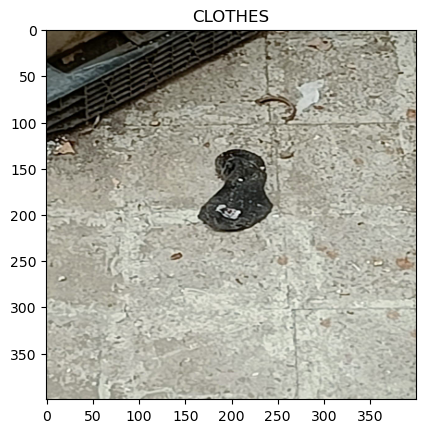

In [300]:
plt.imshow(train_images[1])
plt.title(train_labels[1])
plt.show()

809 images scaled to 224 x 224 pixels with 3 channels (RGB)

In [301]:
# X and X_test as np.arrays for model
X = np.array(train_images)
X_test = np.array(test_images)

In [302]:
# label encoding dictionary
labels = {'CLOTHES': 0, 'GLASS':1, 'METAL': 2, 'PAPER': 3, 'PLASTIC': 4}

# replacing with the dictionary
Y_train_encoded = [labels.get(e, e) for e in train_labels]
Y_test_encoded = [labels.get(e, e) for e in test_labels]


# to categorical
Y = to_categorical(Y_train_encoded, 5)
Y_test = to_categorical(Y_test_encoded, 5)

In [261]:
# validation set using the training data

X_train, X_val, Y_train, Y_val = train_test_split(X, Y, random_state=42, test_size =0.2)

In [262]:
print(X_train.shape, X_val.shape)

(948, 400, 400, 3) (237, 400, 400, 3)


# Initial Convolutional Neural Network

I will create a preliminary CNN model to see any potential downfalls. Then I would possibly follow the three models below. 

1. Without Data Augmentation and Dropout
2. With Data Augmentation and Dropout
3. With a pretrained model on a pretrained classifier with labels

**Model 1: Initial Look**

In [265]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D

In [388]:
# sequential adding of layers
model1 = Sequential()

model1.add(Conv2D(32, (5, 5), activation='relu', input_shape=(400, 400, 3)))
model1.add(MaxPooling2D((3, 3)))
#model1.add(Dropout(0.5))

model1.add(Conv2D(64, (5, 5), activation='relu'))
model1.add(MaxPooling2D((3, 3)))
#model1.add(Dropout(0.5))

model1.add(Conv2D(64, (5, 5), activation='relu'))
#model1.add(MaxPooling2D((3, 3)))
#model1.add(Dropout(0.5))

model1.add(Flatten())
model1.add(Dense(64, activation='relu'))
model1.add(Dense(5, activation='softmax'))

In [389]:
model1.summary()

Model: "sequential_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_82 (Conv2D)          (None, 396, 396, 32)      2432      
                                                                 
 max_pooling2d_61 (MaxPooli  (None, 132, 132, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_83 (Conv2D)          (None, 128, 128, 64)      51264     
                                                                 
 max_pooling2d_62 (MaxPooli  (None, 42, 42, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_84 (Conv2D)          (None, 38, 38, 64)        102464    
                                                                 
 flatten_36 (Flatten)        (None, 92416)           

In [390]:
# compiling using rms and categorical cross entropy loss for classification, metrics as accuracy
model1.compile(optimizer='adam', loss='categorical_crossentropy', 
              metrics=['accuracy'])

history = model1.fit(X_train, Y_train, epochs=10, 
                    validation_data=(X_val, Y_val))

Epoch 1/10
30/30 [==============================] - 59s 2s/step - loss: 2.2171 - accuracy: 0.2922 - val_loss: 1.5671 - val_accuracy: 0.3291
Epoch 2/10
30/30 [==============================] - 52s 2s/step - loss: 1.5413 - accuracy: 0.3534 - val_loss: 1.5728 - val_accuracy: 0.2110
Epoch 3/10
30/30 [==============================] - 52s 2s/step - loss: 1.5412 - accuracy: 0.3302 - val_loss: 1.5416 - val_accuracy: 0.3291
Epoch 4/10
30/30 [==============================] - 51s 2s/step - loss: 1.5454 - accuracy: 0.3502 - val_loss: 1.5368 - val_accuracy: 0.3291
Epoch 5/10
30/30 [==============================] - 51s 2s/step - loss: 1.5243 - accuracy: 0.3502 - val_loss: 1.5141 - val_accuracy: 0.3291
Epoch 6/10
30/30 [==============================] - 53s 2s/step - loss: 1.5083 - accuracy: 0.3502 - val_loss: 1.5054 - val_accuracy: 0.3291
Epoch 7/10
30/30 [==============================] - 53s 2s/step - loss: 1.5034 - accuracy: 0.3502 - val_loss: 1.5165 - val_accuracy: 0.3291
Epoch 8/10
30/30 [==

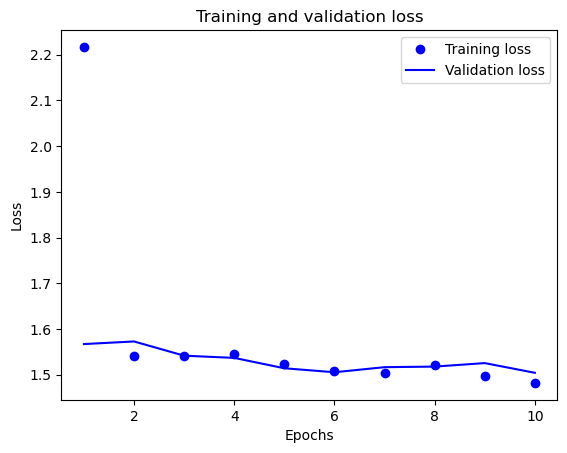

In [391]:
# loss plot
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

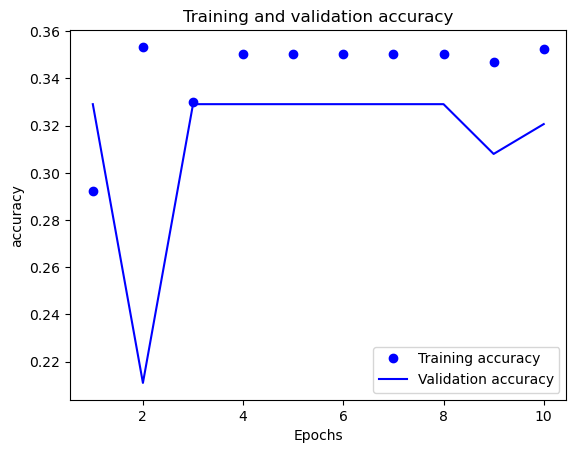

In [392]:
# accuracy plot
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

In [393]:
# evaluating the model against the test dataset
results = model1.evaluate(X_test, Y_test)
results

10/10 [==============================] - 3s 273ms/step - loss: 1.4737 - accuracy: 0.3712


[1.4737427234649658, 0.37123745679855347]

In [394]:
# Making the Predictions
predictions = model1.predict(X_test)

# Converting the predictions into label index 
pred_labels = np.argmax(predictions, axis=1)

10/10 [==============================] - 3s 281ms/step


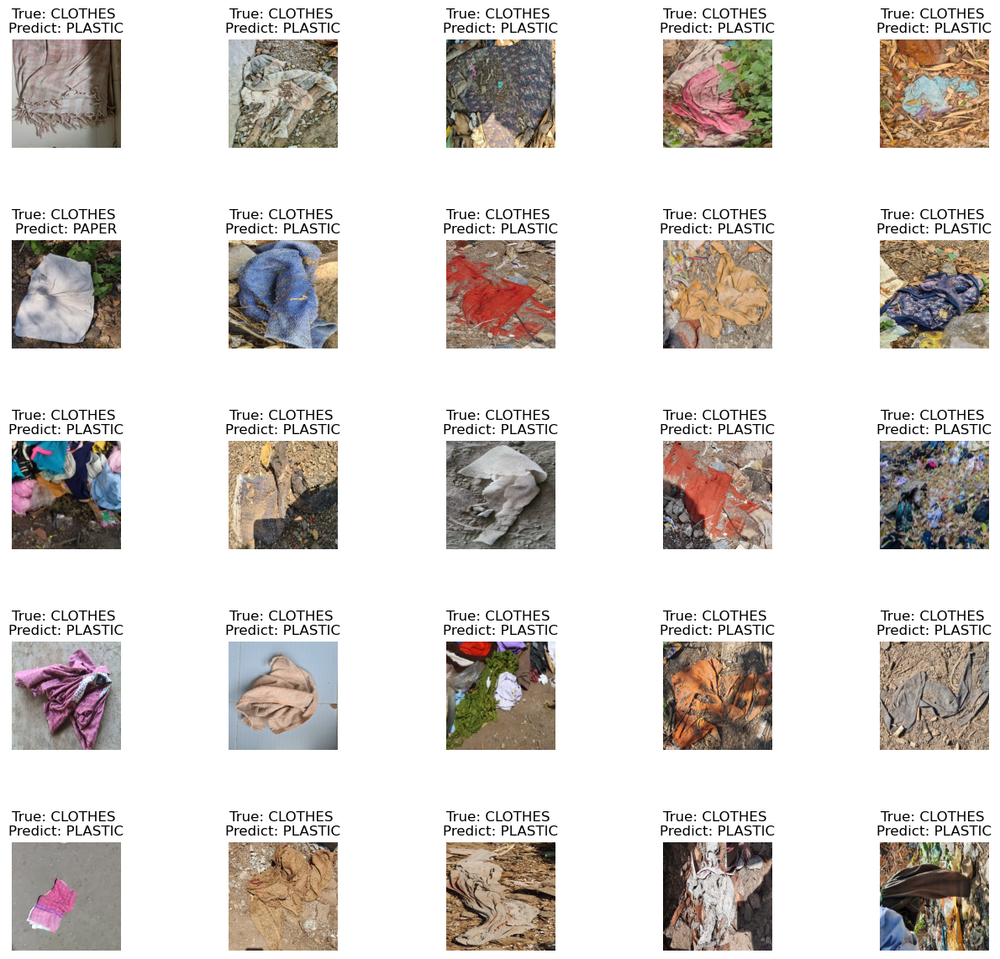

In [395]:
# Plotting the Actual vs. Predicted results
class_names = ['CLOTHES','GLASS', 'METAL', 'PAPER', 'PLASTIC']

fig, axes = plt.subplots(5, 5, figsize=(15,15))
axes = axes.ravel()

for i in np.arange(0, 25):
    axes[i].imshow(X_test[i])
    axes[i].set_title("True: %s \nPredict: %s" % (class_names[np.argmax(Y_test[i])], class_names[pred_labels[i]]))
    axes[i].axis('off')
    plt.subplots_adjust(wspace=1)

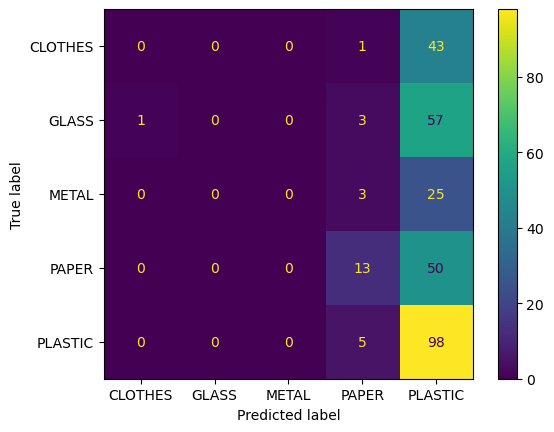

In [396]:
# confusion matrix


inv_dict = dict(zip(labels.values(), labels.keys()))

correct_pred = [inv_dict.get(e, e) for e in pred_labels]

conf_matrix = confusion_matrix(test_labels, correct_pred, labels=class_names)
cm_display = ConfusionMatrixDisplay(confusion_matrix = conf_matrix, display_labels=class_names)
cm_display.plot()
plt.show()

The model classifies almost everything as plastic, which is a problem. Paper is identified at least, but the other three do not have any correct guesses. After doing some research, I found that CNN perform poorly and identify all images as one when that particular subset of data has the most samples. I looked into it, and found that the train folder for plastics has by far the most image, exactly 410 of them. A better thing to try now is to get even amounts of each image. The minimum amount of images in the folder will be the sample size for all classes.

Let's take a look at the directory of images again to make our decision.

In [309]:
sd.seedir(image_dir, depthlimit=2, beyond='content')

garbageimages/
├─Test/
│ ├─CLOTHES/
│ │ └─0 folder(s), 45 file(s)
│ ├─GLASS/
│ │ └─0 folder(s), 61 file(s)
│ ├─METAL/
│ │ └─0 folder(s), 28 file(s)
│ ├─PAPER/
│ │ └─0 folder(s), 63 file(s)
│ └─PLASTIC/
│   └─0 folder(s), 106 file(s)
└─Train/
  ├─CLOTHES/
  │ └─0 folder(s), 180 file(s)
  ├─GLASS/
  │ └─0 folder(s), 241 file(s)
  ├─METAL/
  │ └─0 folder(s), 110 file(s)
  ├─PAPER/
  │ └─0 folder(s), 249 file(s)
  └─PLASTIC/
    └─0 folder(s), 421 file(s)


Ok, so in the train folder, the folder with the smallest size is the metals folder. As a rule of thumb I will chose 100 random images from each folder in the train folder. I don't need to filter the test section because that is used after the model is trained.

In [399]:
# redoing image collection


def get_limited_images():
    train_images2 = []
    train_labels2 = []
    test_images2 = []
    test_labels2 = []
    for t_folder in os.listdir('clean_garbageimages/'):
        for folder in os.listdir('clean_garbageimages/'+t_folder):
            if t_folder == 'Train':
                # print('here')
                for file in random.sample(os.listdir('clean_garbageimages/'+t_folder+'/'+folder),100):
                    #print(file)
                    #print('train here')
                    img = load_img(image_fixed_dir.joinpath(t_folder+'/'+folder+'/'+file), target_size=(400, 400))
                    img = img_to_array(img)
                    img = img/255
                    train_images2.append(img)
                    train_labels2.append(folder)
            else:
                for file in os.listdir('clean_garbageimages/'+t_folder+'/'+folder):
                    #print('train here')
                    img = load_img(image_fixed_dir.joinpath(t_folder+'/'+folder+'/'+file), target_size=(400, 400))
                    img = img_to_array(img)
                    img = img/255
                    test_images2.append(img)
                    test_labels2.append(folder)
    print('Train Shape:', len(train_images2), len(train_labels2))
    print('Test Shape:',len(test_images2), len(test_labels2))
    return train_images2, train_labels2, test_images2, test_labels2

In [400]:
train_images2, train_labels2, test_images2, test_labels2 = get_limited_images()

Train Shape: 500 500
Test Shape: 299 299


In [3]:
# first we need to shuffle the train and test lists of images at the same time to make sure that the labels and 
# images are still together

def shuffle_two(lst1, lst2):
    zipped = list(zip(lst1, lst2))
    random.shuffle(zipped)
    lst1_shuffle, lst2_shuffle = zip(*zipped)
    return lst1_shuffle, lst2_shuffle

# shuffled labels and images
train_images2_shuffle, train_labels2_shuffle = shuffle_two(train_images2, train_labels2) 
test_images2_shuffle, test_labels2_shuffle = shuffle_two(test_images2, test_labels2) 

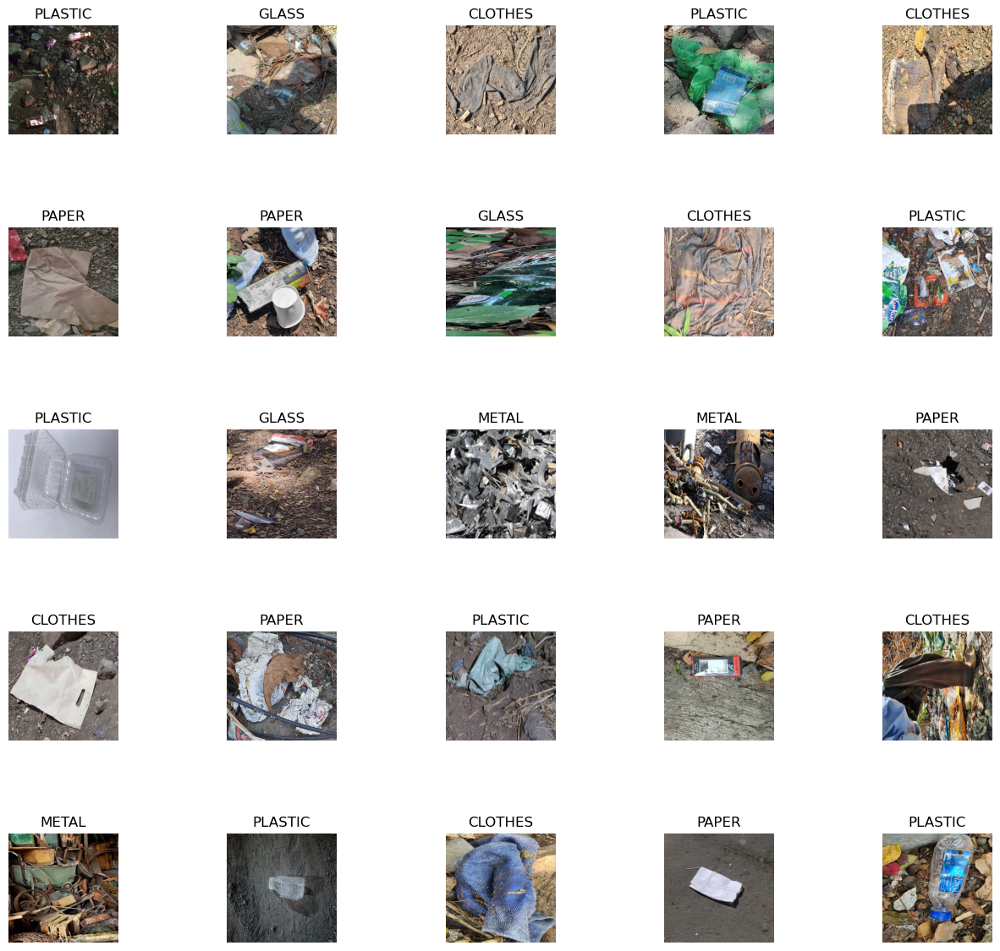

In [401]:
# confirming the shuffle was done correctly
class_names = ['CLOTHES','GLASS', 'METAL', 'PAPER', 'PLASTIC']

fig, axes = plt.subplots(5, 5, figsize=(15,15))
axes = axes.ravel()

for i in np.arange(0, 25):
    axes[i].imshow(test_images2_shuffle[i])
    axes[i].set_title(test_labels2_shuffle[i])
    axes[i].axis('off')
    plt.subplots_adjust(wspace=1)

In [404]:
# next convert everything to arrays

# X and X_test as np.arrays for model
X2 = np.array(train_images2_shuffle)
X_test2 = np.array(test_images2_shuffle)

# replacing with the dictionary
Y_train_encoded2 = [labels.get(e, e) for e in train_labels2_shuffle]
Y_test_encoded2 = [labels.get(e, e) for e in test_labels2_shuffle]


# to categorical
Y2 = to_categorical(Y_train_encoded2, 5)
Y_test2 = to_categorical(Y_test_encoded2, 5)

# validation set using the training data
X_train2, X_val2, Y_train2, Y_val2 = train_test_split(X2, Y2, random_state=42, test_size =0.1)

**Model 2: Shuffled and Limited**

In [408]:
# sequential adding of layers
model2 = Sequential()

model2.add(Conv2D(32, (5, 5), activation='relu', input_shape=(400, 400, 3)))
model2.add(MaxPooling2D((3, 3)))
#model2.add(Dropout(0.25))

model2.add(Conv2D(64, (5, 5), activation='relu'))
model2.add(MaxPooling2D((3, 3)))
#model2.add(Dropout(0.25))

model2.add(Conv2D(64, (5, 5), activation='relu'))
model2.add(MaxPooling2D((3, 3)))
#model1.add(Dropout(0.5))

model2.add(Flatten())
model2.add(Dense(64, activation='relu'))
model2.add(Dense(5, activation='softmax'))

In [409]:
model2.summary()

Model: "sequential_41"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_88 (Conv2D)          (None, 396, 396, 32)      2432      
                                                                 
 max_pooling2d_66 (MaxPooli  (None, 132, 132, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_89 (Conv2D)          (None, 128, 128, 64)      51264     
                                                                 
 max_pooling2d_67 (MaxPooli  (None, 42, 42, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_90 (Conv2D)          (None, 38, 38, 64)        102464    
                                                                 
 max_pooling2d_68 (MaxPooli  (None, 12, 12, 64)      

In [410]:
model2.compile(optimizer='adam', loss='categorical_crossentropy', 
              metrics=['accuracy'])

history = model2.fit(X_train2, Y_train2, epochs=10, 
                    validation_data=(X_val2, Y_val2))

Epoch 1/10
15/15 [==============================] - 25s 2s/step - loss: 1.7615 - accuracy: 0.2222 - val_loss: 1.6176 - val_accuracy: 0.1000
Epoch 2/10
15/15 [==============================] - 25s 2s/step - loss: 1.6109 - accuracy: 0.1978 - val_loss: 1.6115 - val_accuracy: 0.2400
Epoch 3/10
15/15 [==============================] - 24s 2s/step - loss: 1.6079 - accuracy: 0.2200 - val_loss: 1.6250 - val_accuracy: 0.1000
Epoch 4/10
15/15 [==============================] - 25s 2s/step - loss: 1.6139 - accuracy: 0.1889 - val_loss: 1.6102 - val_accuracy: 0.1000
Epoch 5/10
15/15 [==============================] - 25s 2s/step - loss: 1.6085 - accuracy: 0.2311 - val_loss: 1.6178 - val_accuracy: 0.1600
Epoch 6/10
15/15 [==============================] - 25s 2s/step - loss: 1.6058 - accuracy: 0.2467 - val_loss: 1.6027 - val_accuracy: 0.2800
Epoch 7/10
15/15 [==============================] - 25s 2s/step - loss: 1.6005 - accuracy: 0.2689 - val_loss: 1.6125 - val_accuracy: 0.1400
Epoch 8/10
15/15 [==

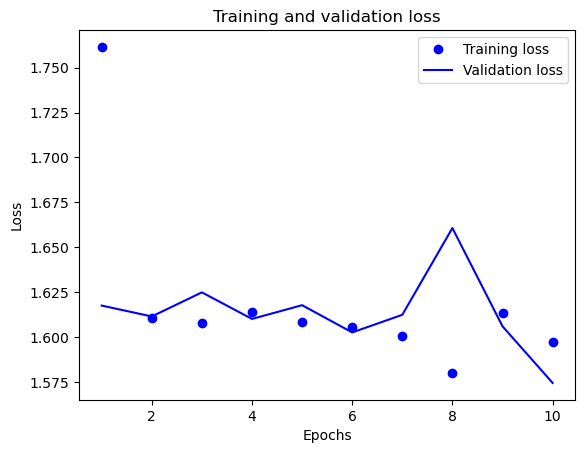

In [411]:
# loss plot
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

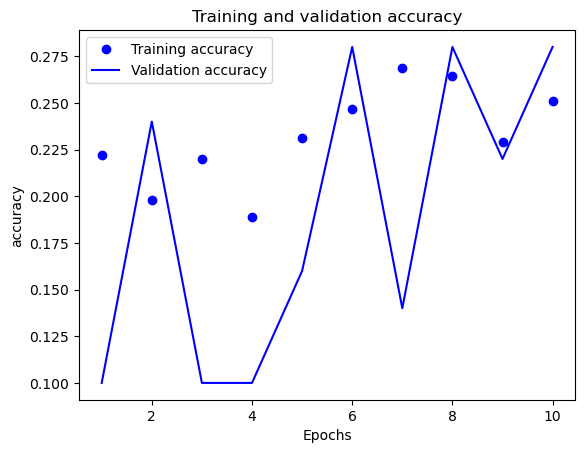

In [412]:
# accuracy plot
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

In [415]:
# evaluating the model against the test dataset
results = model2.evaluate(X_test2, Y_test2)
results

10/10 [==============================] - 3s 275ms/step - loss: 1.6080 - accuracy: 0.1706


[1.6079832315444946, 0.1705685555934906]

In [416]:
# Making the Predictions
predictions2 = model2.predict(X_test2)

# Converting the predictions into label index 
pred_labels2 = np.argmax(predictions2, axis=1)

10/10 [==============================] - 3s 283ms/step


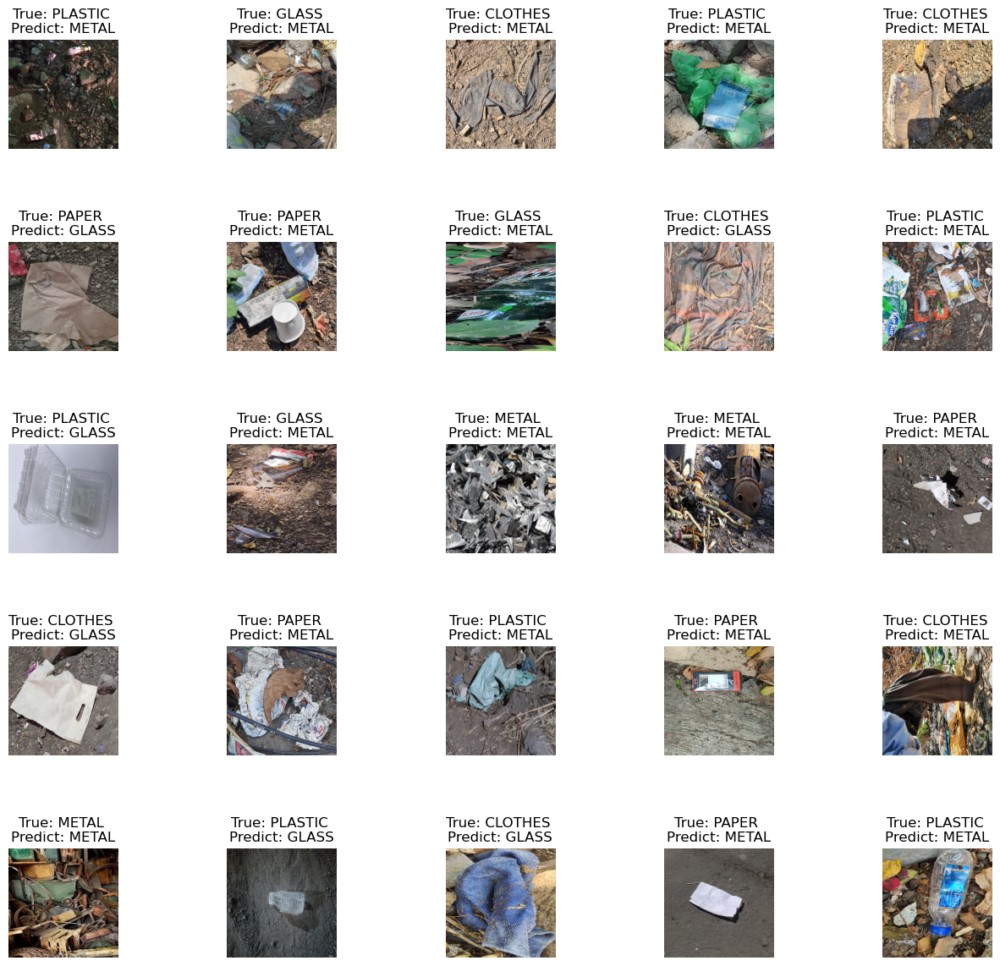

In [417]:
# Plotting the Actual vs. Predicted results
class_names = ['CLOTHES','GLASS', 'METAL', 'PAPER', 'PLASTIC']

fig, axes = plt.subplots(5, 5, figsize=(15,15))
axes = axes.ravel()

for i in np.arange(0, 25):
    axes[i].imshow(X_test2[i])
    axes[i].set_title("True: %s \nPredict: %s" % (class_names[np.argmax(Y_test2[i])], class_names[pred_labels2[i]]))
    axes[i].axis('off')
    plt.subplots_adjust(wspace=1)

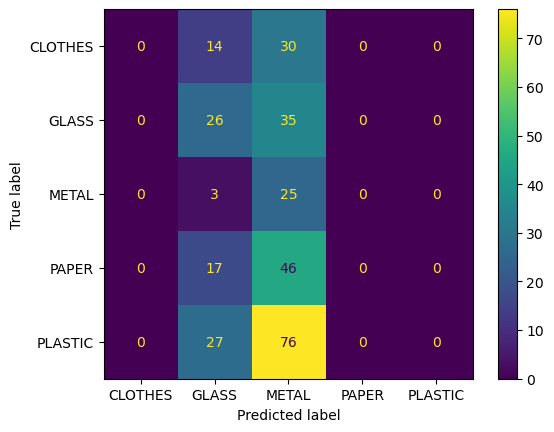

In [419]:
correct_pred2 = [inv_dict.get(e, e) for e in pred_labels2]

conf_matrix2 = confusion_matrix(test_labels2_shuffle, correct_pred2, labels=class_names)
cm_display2 = ConfusionMatrixDisplay(confusion_matrix = conf_matrix2, display_labels=class_names)
cm_display2.plot()
plt.show()

When trying to simplify the dataset into smaller groups so that each class is represented fairly equally, we now run into the issue of the model classifying everything as metal. I now need to figure out what would be the optimal strategy, or if there is some kind of data augmentation I can do which erases the background completely and each object is now on a blank slate for easier analysis.

**Initial Analysis:** Based on the two CNNs I've built, I've came to two conclusions. In the presence of a larger subset of data for one class over others, the model classifies a majority of everything as such. In this case, plastic is the most abundant set of images in both train and test, hence the 30% accuracy in the first model. After accommodating for the imbalance, I found that metals are now being overclassified. I think the reasoning may be that most metal images in the dataset are the same color as the background color of the images. The model might be quick to judge and assign images with dirt in the background as metal.

**Possible Solutions:** In order to solve this background issue and perhaps even the oversampling issue, I will look for python packages which remove the background and eliminate the factor of incorrect classification based on the color in the background.

## Data Augmentation

I found a package called rembg which removes the background noise of an image using AI. I will try to use that first with the nonfiltered dataset and see results.

Link for explanation:
https://www.geeksforgeeks.org/how-to-remove-the-background-from-an-image-using-python/

In [3]:
from rembg import remove

C:\ProgramData\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [6]:
ai_path = 'ai_garbageimages/Train/CLOTHES/ai_test.jpg'
test_path = 'clean_garbageimages/Train/CLOTHES/clothes_image_(1).jpg'

# Processing the image 
im = Image.open(test_path) 
im = im.convert('RGB')  
# Removing the background from the given Image 
output = remove(im)
output = output.convert('RGB') 
  
#Saving the image in the given path 
output.save(ai_path) 

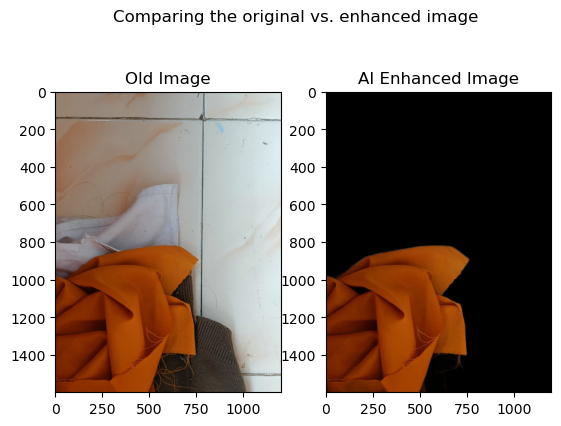

In [17]:
# comparing the original vs. the ai cleaned one
fig, axs = plt.subplots(1,2)

old_im = Image.open(test_path)
ai_im = Image.open(ai_path)

fig.suptitle('Comparing the original vs. enhanced image')
axs[0].imshow(old_im)
axs[0].title.set_text('Old Image')
axs[1].imshow(ai_im)
axs[1].title.set_text('AI Enhanced Image')
plt.show()

In [27]:
# creating new sets of images with enhancing
def remove_background():
    for t_folder in os.listdir('clean_garbageimages'):
    #print(t_folder)
        for folder in os.listdir('clean_garbageimages/'+t_folder):
            #print(folder)
            for file in os.listdir('clean_garbageimages/'+t_folder+'/'+folder):
                #print(file)
                image = Image.open(image_fixed_dir.joinpath(t_folder+'/'+folder+'/'+file))
                image = image.convert('RGB')
                
                # enhancing
                # Removing the background from the given Image 
                output = remove(image)
                output = output.convert('RGB')
                
                clean_file_name = file[:-4]
                
                output.save(ai_dir.joinpath(t_folder+'/'+folder+'/'+clean_file_name+'.jpg'), "JPEG")

In [28]:
# uncomment to remove background after creating the ai directory and subdirectories properly
#remove_background()

## AI Model Test Drive

With the AI enhanced images in their respective directories, it's now time to run previous methods and run a model.

In [4]:
def get_ai_images():
    train_images_ai = []
    train_labels_ai = []
    test_images_ai = []
    test_labels_ai = []

    for t_folder in os.listdir('ai_garbageimages/'):
        for folder in os.listdir('ai_garbageimages/'+t_folder):
            if t_folder == 'Train':
                # print('here')
                for file in os.listdir('ai_garbageimages/'+t_folder+'/'+folder):
                    #print(file)
                    #print('train here')
                    img = load_img(ai_dir.joinpath(t_folder+'/'+folder+'/'+file), target_size=(400, 400))
                    img = img_to_array(img)
                    img = img/255
                    train_images_ai.append(img)
                    train_labels_ai.append(folder)
            else:
                for file in os.listdir('ai_garbageimages/'+t_folder+'/'+folder):
                    #print('train here')
                    img = load_img(ai_dir.joinpath(t_folder+'/'+folder+'/'+file), target_size=(400, 400))
                    img = img_to_array(img)
                    img = img/255
                    test_images_ai.append(img)
                    test_labels_ai.append(folder)
    
    print('Train Shape:', len(train_images_ai), len(train_labels_ai))
    print('Test Shape:',len(test_images_ai), len(test_labels_ai))
    return train_images_ai, train_labels_ai, test_images_ai, test_labels_ai

In [5]:
train_images_ai, train_labels_ai, test_images_ai, test_labels_ai = get_ai_images()

Train Shape: 1185 1185
Test Shape: 299 299


In [6]:
# shuffled labels and images
train_images_ai_shuffle, train_labels_ai_shuffle = shuffle_two(train_images_ai, train_labels_ai) 
test_images_ai_shuffle, test_labels_ai_shuffle = shuffle_two(test_images_ai, test_labels_ai) 

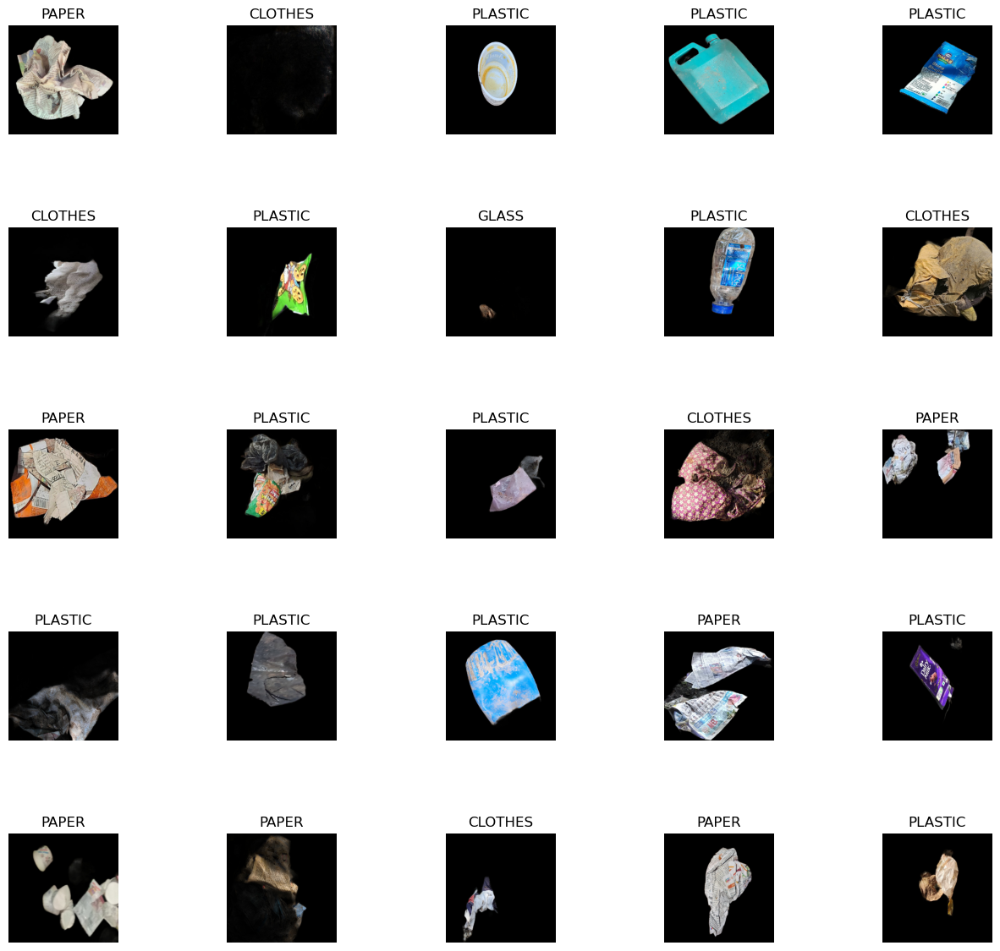

In [50]:
# confirming the shuffle was done correctly
class_names = ['CLOTHES','GLASS', 'METAL', 'PAPER', 'PLASTIC']

fig, axes = plt.subplots(5, 5, figsize=(15,15))
axes = axes.ravel()

for i in np.arange(0, 25):
    axes[i].imshow(test_images_ai_shuffle[i])
    axes[i].set_title(test_labels_ai_shuffle[i])
    axes[i].axis('off')
    plt.subplots_adjust(wspace=1)

In [7]:
labels = {'CLOTHES': 0, 'GLASS':1, 'METAL': 2, 'PAPER': 3, 'PLASTIC': 4}

# next convert everything to arrays

# X and X_test as np.arrays for model
X_ai = np.array(train_images_ai_shuffle)
X_test_ai = np.array(test_images_ai_shuffle)

# replacing with the dictionary
Y_train_ai_encoded = [labels.get(e, e) for e in train_labels_ai_shuffle]
Y_test_ai_encoded = [labels.get(e, e) for e in test_labels_ai_shuffle]


# to categorical
Y_ai = to_categorical(Y_train_ai_encoded, 5)
Y_test_ai = to_categorical(Y_test_ai_encoded, 5)

# validation set using the training data
X_train_ai, X_val_ai, Y_train_ai, Y_val_ai = train_test_split(X_ai, Y_ai, random_state=42, test_size =0.2)

**Model 2: AI Enhanced and Shuffled**

In [55]:
# sequential adding of layers
model3 = Sequential()

model3.add(Conv2D(32, (5, 5), activation='relu', input_shape=(400, 400, 3)))
model3.add(MaxPooling2D((3, 3)))
#model2.add(Dropout(0.25))

model3.add(Conv2D(64, (5, 5), activation='relu'))
model3.add(MaxPooling2D((3, 3)))
#model2.add(Dropout(0.25))

model3.add(Conv2D(64, (5, 5), activation='relu'))
model3.add(MaxPooling2D((3, 3)))
#model1.add(Dropout(0.5))

model3.add(Flatten())
model3.add(Dense(64, activation='relu'))
model3.add(Dense(5, activation='softmax'))

In [57]:
model3.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 396, 396, 32)      2432      
                                                                 
 max_pooling2d (MaxPooling2  (None, 132, 132, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      51264     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 42, 42, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 38, 38, 64)        102464    
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 12, 12, 64)        0

In [58]:
model3.compile(optimizer='adam', loss='categorical_crossentropy', 
              metrics=['accuracy'])

history3 = model3.fit(X_train_ai, Y_train_ai, epochs=10, 
                    validation_data=(X_val_ai, Y_val_ai))

Epoch 1/10
30/30 [==============================] - 50s 2s/step - loss: 1.5308 - accuracy: 0.3186 - val_loss: 1.5053 - val_accuracy: 0.3291
Epoch 2/10
30/30 [==============================] - 50s 2s/step - loss: 1.4560 - accuracy: 0.3618 - val_loss: 1.5474 - val_accuracy: 0.3122
Epoch 3/10
30/30 [==============================] - 50s 2s/step - loss: 1.3714 - accuracy: 0.4030 - val_loss: 1.6039 - val_accuracy: 0.2405
Epoch 4/10
30/30 [==============================] - 50s 2s/step - loss: 1.2338 - accuracy: 0.4736 - val_loss: 1.6793 - val_accuracy: 0.3038
Epoch 5/10
30/30 [==============================] - 50s 2s/step - loss: 1.0302 - accuracy: 0.5907 - val_loss: 1.9430 - val_accuracy: 0.2616
Epoch 6/10
30/30 [==============================] - 50s 2s/step - loss: 0.7294 - accuracy: 0.7173 - val_loss: 2.5891 - val_accuracy: 0.2700
Epoch 7/10
30/30 [==============================] - 50s 2s/step - loss: 0.4968 - accuracy: 0.8270 - val_loss: 2.8647 - val_accuracy: 0.2658
Epoch 8/10
30/30 [==

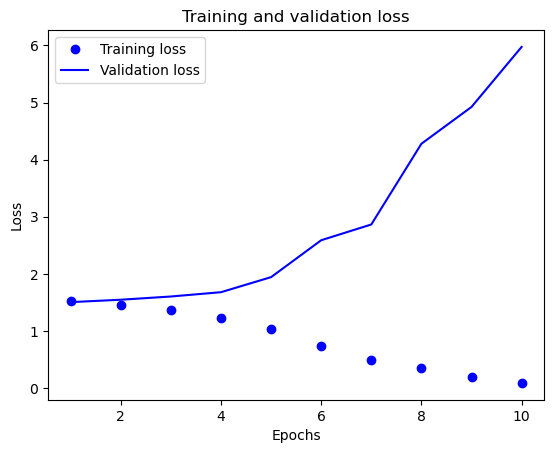

In [68]:
# loss plot
loss = history3.history['loss']
val_loss = history3.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

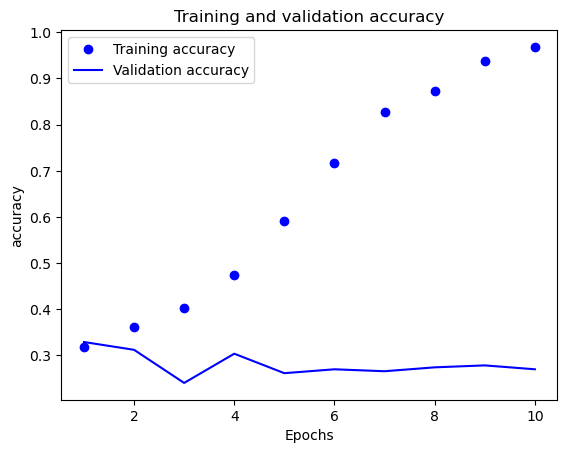

In [69]:
# accuracy plot
acc = history3.history['accuracy']
val_acc = history3.history['val_accuracy']
plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

In [60]:
# evaluating the model against the test dataset
results_ai = model3.evaluate(X_test_ai, Y_test_ai)
results_ai

10/10 [==============================] - 3s 255ms/step - loss: 6.9286 - accuracy: 0.2809


[6.92864465713501, 0.28093644976615906]

In [61]:
# Making the Predictions
predictions_ai = model3.predict(X_test_ai)

# Converting the predictions into label index 
pred_labels_ai = np.argmax(predictions_ai, axis=1)

10/10 [==============================] - 3s 271ms/step


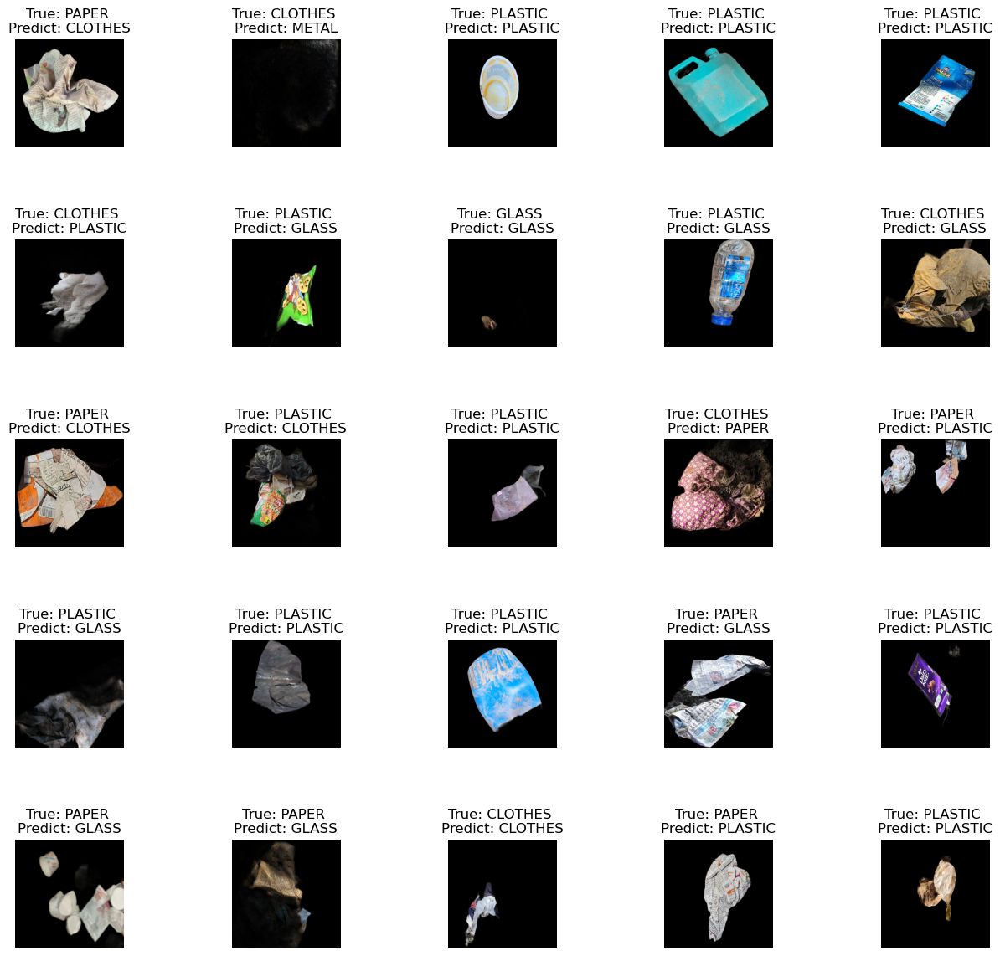

In [62]:
# Plotting the Actual vs. Predicted results
class_names = ['CLOTHES','GLASS', 'METAL', 'PAPER', 'PLASTIC']

fig, axes = plt.subplots(5, 5, figsize=(15,15))
axes = axes.ravel()

for i in np.arange(0, 25):
    axes[i].imshow(X_test_ai[i])
    axes[i].set_title("True: %s \nPredict: %s" % (class_names[np.argmax(Y_test_ai[i])], class_names[pred_labels_ai[i]]))
    axes[i].axis('off')
    plt.subplots_adjust(wspace=1)

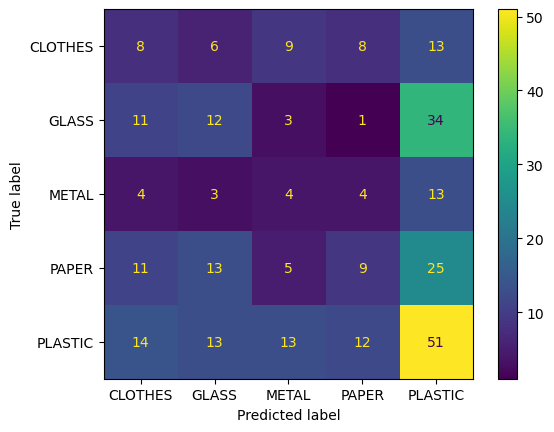

In [66]:
inv_dict = dict(zip(labels.values(), labels.keys()))
correct_pred_ai = [inv_dict.get(e, e) for e in pred_labels_ai]

conf_matrix_ai = confusion_matrix(test_labels_ai_shuffle, correct_pred_ai, labels=class_names)
cm_display_ai = ConfusionMatrixDisplay(confusion_matrix = conf_matrix_ai, display_labels=class_names)
cm_display_ai.plot()
plt.show()

With AI data augmentation, the model performs better in the sense that it can actually predict other objects and is not distributed asymmetrically across one category as we have seen with the unenhanced and unfiltered images for plastic and the filtered as metal. Plastic still appears to be the most dominant class prediction, but we are on the right track. Now it's time to do some additional optimization:

1. Try to take out images that are more than 80% / 90% black
2. Try limiting the data to 100 of each category in the training set as attempted before.
3. Tune the hyperparameters of the model

But it looks like we are finally on the right track!

### 1. Removing images that have more than 80% black

I looked into some functions and attributes of libraries that may help accomplish this task. One of which uses Image.getcolors from the Pillow library.

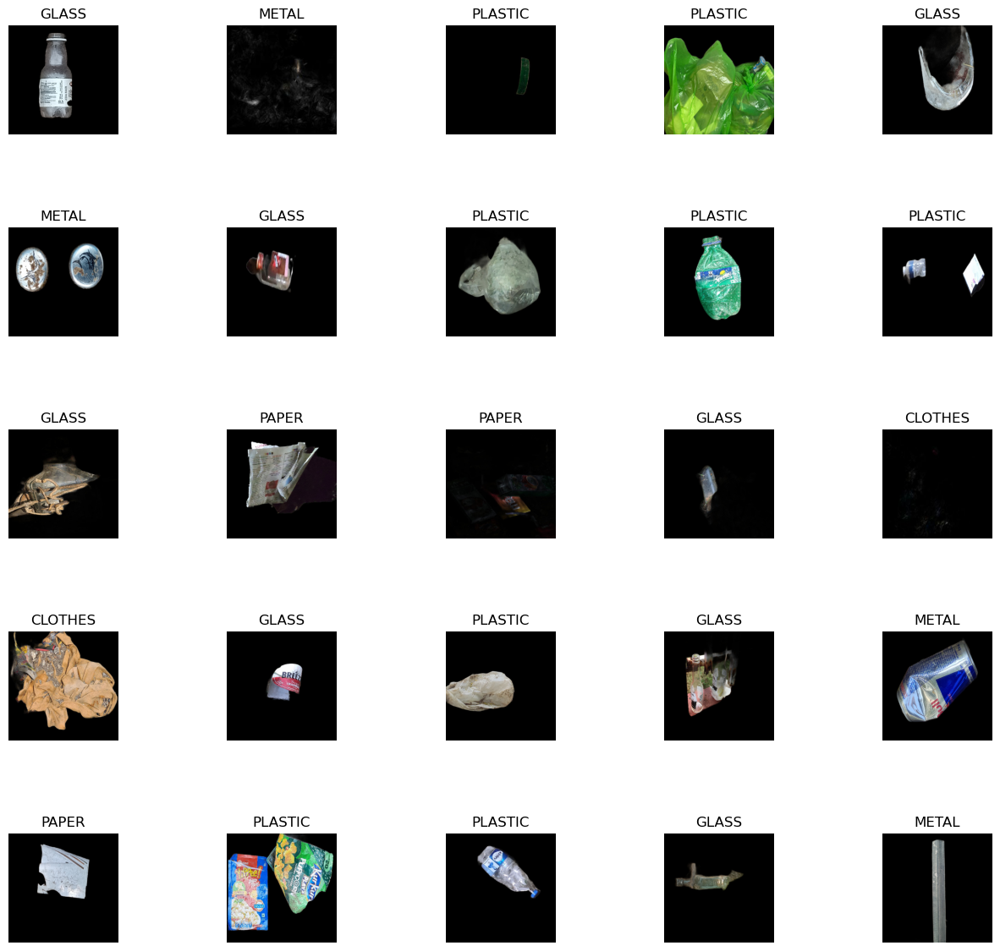

In [43]:
# had to run code from here, so I got a new set of shuffled images
class_names = ['CLOTHES','GLASS', 'METAL', 'PAPER', 'PLASTIC']

fig, axes = plt.subplots(5, 5, figsize=(15,15))
axes = axes.ravel()

for i in np.arange(0, 25):
    axes[i].imshow(test_images_ai_shuffle[i])
    axes[i].set_title(test_labels_ai_shuffle[i])
    axes[i].axis('off')
    plt.subplots_adjust(wspace=1)

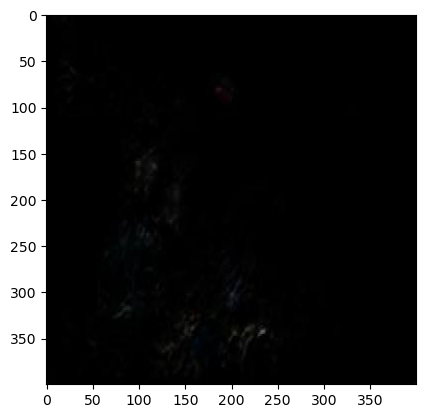

In [30]:
# testing methods for converting an image back 
plt.imshow(Image.fromarray((test_images_ai_shuffle[14] * 255).astype(np.uint8), 'RGB'))

In [31]:
# example method for counting black pixels
# I tried pillow get colors and get palette but they didn't work the way I expected them to, so I ended up hard coding
# through the array

pixel_count = 0
for pixel in test_images_ai_shuffle[14]:
    array_count = 0
    for array in pixel:
        # if entire array is 0
        if np.all(array==array[0]):
            array_count +=1
    # if more than 320 arrays in the pixel contains only zero, then the pixel is 0
    if array_count >= 320:
        pixel_count +=1
    
            
print(pixel_count)

342


This image is mostly black, and the pixel count demonstrates that 342 out of the 400 pixels are black.

In [9]:
# writing a quick helper function
def percent_black(im_array):
    #plt.imshow(im_array)
    pixel_count = 0
    for pixel in im_array:
        array_count = 0
        for array in pixel:
            # if entire array is 0
            if np.all(array==array[0]):
                array_count +=1
        # if more than 320 arrays in the pixel contains only zero, then the pixel is 0
        if array_count >= 320:
            pixel_count +=1
    percent = pixel_count / 400
    return percent

0.575


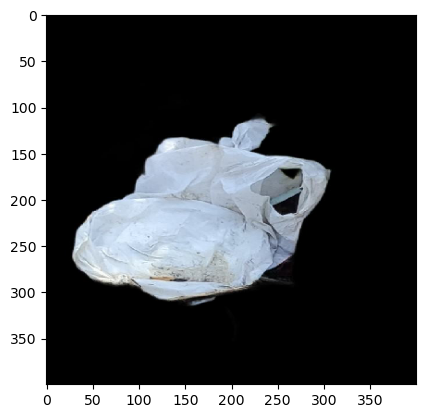

In [18]:
print(percent_black(test_images_ai_shuffle[10]))
plt.imshow(test_images_ai_shuffle[10])

In [19]:
# iterating through lists to get finalized set of images
# i will use the shuffled list so I don't have to go through that twice

def no_black_images(image_lst, label_lst):
    images = []
    labels =[]
    
    # looping through image and labels
    #j = 0
    for i, l in zip(image_lst, label_lst):
        if percent_black(i) < 0.8:
            #print('here')
            #print(percent_black(i))
            images.append(i)
            labels.append(l)
        else:
            continue
        #j+=1
    
    print('Before:',len(image_lst), 'After:',len(images))
    return images, labels

In [20]:
train_images_ai2, train_labels_ai2 = no_black_images(train_images_ai_shuffle, train_labels_ai_shuffle) 

Before: 1185 After: 1001


In [21]:
test_images_ai2, test_labels_ai2 = no_black_images(test_images_ai_shuffle, test_labels_ai_shuffle) 

Before: 299 After: 243


In [22]:
labels = {'CLOTHES': 0, 'GLASS':1, 'METAL': 2, 'PAPER': 3, 'PLASTIC': 4}

# next convert everything to arrays

# X and X_test as np.arrays for model
X_ai = np.array(train_images_ai2)
X_test_ai = np.array(test_images_ai2)

# replacing with the dictionary
Y_train_ai_encoded = [labels.get(e, e) for e in train_labels_ai2]
Y_test_ai_encoded = [labels.get(e, e) for e in test_labels_ai2]


# to categorical
Y_ai = to_categorical(Y_train_ai_encoded, 5)
Y_test_ai = to_categorical(Y_test_ai_encoded, 5)

# validation set using the training data
X_train_ai, X_val_ai, Y_train_ai, Y_val_ai = train_test_split(X_ai, Y_ai, random_state=42, test_size =0.1)

**Model 4: AI, No Black, Shuffled**

In [87]:
# sequential adding of layers
model4 = Sequential()

model4.add(Conv2D(32, (5, 5), activation='relu', input_shape=(400, 400, 3)))
model4.add(MaxPooling2D((3, 3)))
#model4.add(Dropout(0.25))

model4.add(Conv2D(64, (5, 5), activation='relu'))
model4.add(MaxPooling2D((3, 3)))
#model4.add(Dropout(0.25))

model4.add(Conv2D(64, (5, 5), activation='relu'))
model4.add(MaxPooling2D((3, 3)))
#model1.add(Dropout(0.5))

model4.add(Flatten())
model4.add(Dense(64, activation='relu'))
model4.add(Dense(5, activation='softmax'))

In [88]:
model4.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 396, 396, 32)      2432      
                                                                 
 max_pooling2d_18 (MaxPooli  (None, 132, 132, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_19 (Conv2D)          (None, 128, 128, 64)      51264     
                                                                 
 max_pooling2d_19 (MaxPooli  (None, 42, 42, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_20 (Conv2D)          (None, 38, 38, 64)        102464    
                                                                 
 max_pooling2d_20 (MaxPooli  (None, 12, 12, 64)       

In [89]:
model4.compile(optimizer='adam', loss='categorical_crossentropy', 
              metrics=['accuracy'])

history4 = model4.fit(X_train_ai, Y_train_ai, epochs=10, 
                    validation_data=(X_val_ai, Y_val_ai))

Epoch 1/10
29/29 [==============================] - 49s 2s/step - loss: 1.5278 - accuracy: 0.3400 - val_loss: 1.5208 - val_accuracy: 0.3168
Epoch 2/10
29/29 [==============================] - 48s 2s/step - loss: 1.4419 - accuracy: 0.3444 - val_loss: 1.4867 - val_accuracy: 0.3366
Epoch 3/10
29/29 [==============================] - 47s 2s/step - loss: 1.3724 - accuracy: 0.3967 - val_loss: 1.5442 - val_accuracy: 0.3861
Epoch 4/10
29/29 [==============================] - 47s 2s/step - loss: 1.2633 - accuracy: 0.4389 - val_loss: 1.6288 - val_accuracy: 0.2772
Epoch 5/10
29/29 [==============================] - 47s 2s/step - loss: 1.1368 - accuracy: 0.5122 - val_loss: 1.6665 - val_accuracy: 0.3861
Epoch 6/10
29/29 [==============================] - 48s 2s/step - loss: 0.9347 - accuracy: 0.6556 - val_loss: 2.0435 - val_accuracy: 0.2475
Epoch 7/10
29/29 [==============================] - 47s 2s/step - loss: 0.7787 - accuracy: 0.7122 - val_loss: 2.1162 - val_accuracy: 0.3960
Epoch 8/10
29/29 [==

In [90]:
# evaluating the model against the test dataset
results_ai = model4.evaluate(X_test_ai, Y_test_ai)
results_ai

8/8 [==============================] - 2s 277ms/step - loss: 3.4552 - accuracy: 0.3004


[3.4552083015441895, 0.30041152238845825]

In [91]:
# Making the Predictions
predictions_ai = model4.predict(X_test_ai)

# Converting the predictions into label index 
pred_labels_ai = np.argmax(predictions_ai, axis=1)

8/8 [==============================] - 2s 264ms/step


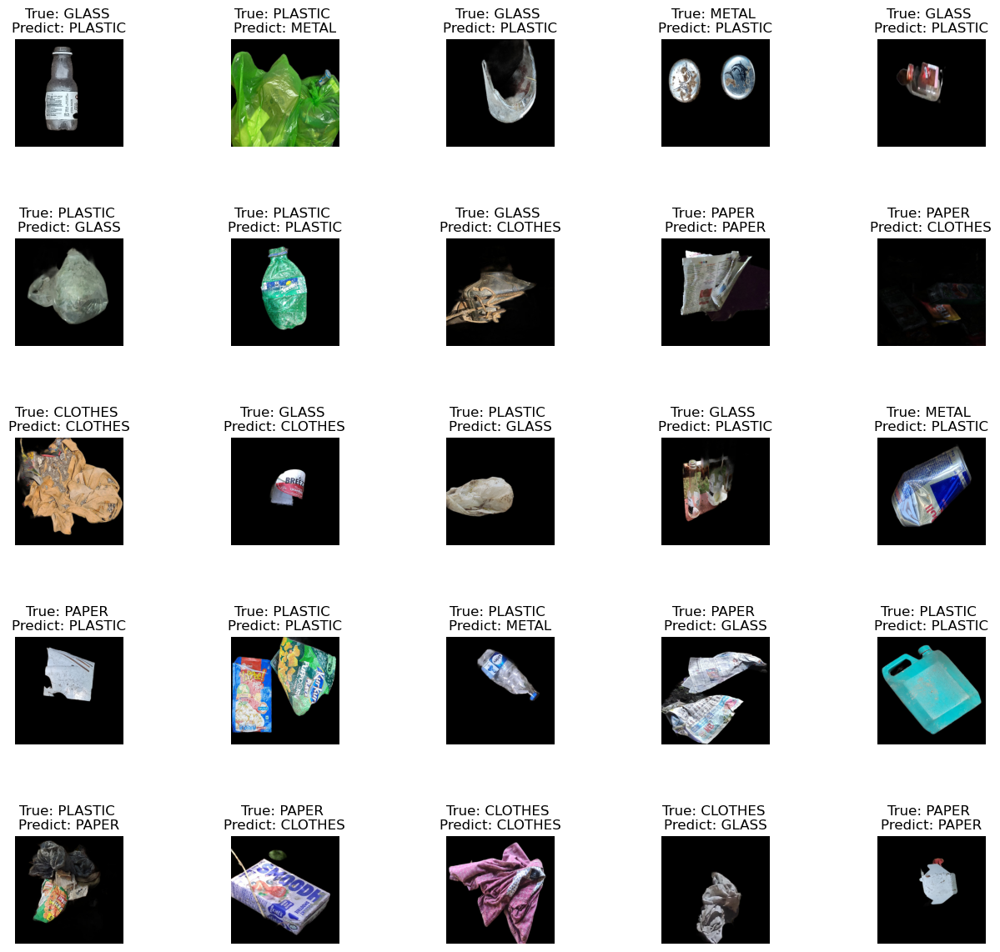

In [92]:
# Plotting the Actual vs. Predicted results
class_names = ['CLOTHES','GLASS', 'METAL', 'PAPER', 'PLASTIC']

fig, axes = plt.subplots(5, 5, figsize=(15,15))
axes = axes.ravel()

for i in np.arange(0, 25):
    axes[i].imshow(X_test_ai[i])
    axes[i].set_title("True: %s \nPredict: %s" % (class_names[np.argmax(Y_test_ai[i])], class_names[pred_labels_ai[i]]))
    axes[i].axis('off')
    plt.subplots_adjust(wspace=1)

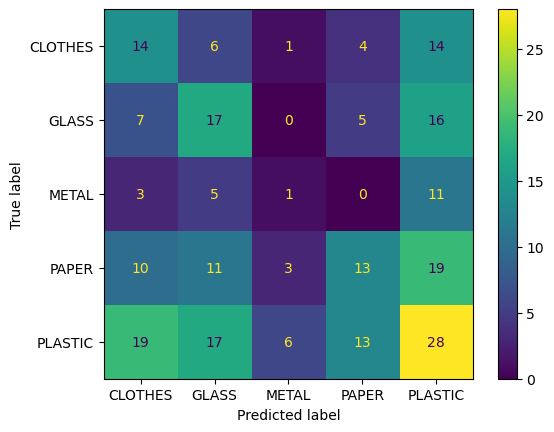

In [94]:
inv_dict = dict(zip(labels.values(), labels.keys()))
correct_pred_ai = [inv_dict.get(e, e) for e in pred_labels_ai]

conf_matrix_ai = confusion_matrix(test_labels_ai2, correct_pred_ai, labels=class_names)
cm_display_ai = ConfusionMatrixDisplay(confusion_matrix = conf_matrix_ai, display_labels=class_names)
cm_display_ai.plot()
plt.show()

The model is working better than before with the cleaned data set. Although with only a 2% increase in model accuracy we can see that there are much higher predictions in each of the categories except metal. Plastic predictions still dominate most of the classifications, but we can still work on tuning the hyperparameters of the model. 

### 2. Balancing Classes

In [101]:
def get_ai_limited_images():
    train_images_ai_2 = []
    train_labels_ai_2 = []
    test_images_ai_2 = []
    test_labels_ai_2 = []
    for t_folder in os.listdir('ai_garbageimages/'):
        for folder in os.listdir('ai_garbageimages/'+t_folder):
            if t_folder == 'Train':
                # print('here')
                for file in random.sample(os.listdir('ai_garbageimages/'+t_folder+'/'+folder),100):
                    #print(file)
                    #print('train here')
                    img = load_img(image_fixed_dir.joinpath(t_folder+'/'+folder+'/'+file), target_size=(400, 400))
                    img = img_to_array(img)
                    img = img/255
                    train_images_ai_2.append(img)
                    train_labels_ai_2.append(folder)
            else:
                for file in os.listdir('ai_garbageimages/'+t_folder+'/'+folder):
                    #print('train here')
                    img = load_img(image_fixed_dir.joinpath(t_folder+'/'+folder+'/'+file), target_size=(400, 400))
                    img = img_to_array(img)
                    img = img/255
                    test_images_ai_2.append(img)
                    test_labels_ai_2.append(folder)
    print('Train Shape:', len(train_images_ai_2), len(train_labels_ai_2))
    print('Test Shape:',len(test_images_ai_2), len(test_labels_ai_2))
    return train_images_ai_2, train_labels_ai_2, test_images_ai_2, test_labels_ai_2

In [103]:
train_images_ai_2, train_labels_ai_2, test_images_ai_2, test_labels_ai_2 = get_ai_limited_images()

Train Shape: 500 500
Test Shape: 299 299


In [107]:
# shuffled labels and images
train_images_ai_shuffle2, train_labels_ai_shuffle2 = shuffle_two(train_images_ai_2, train_labels_ai_2) 
test_images_ai_shuffle2, test_labels_ai_shuffle2 = shuffle_two(test_images_ai_2, test_labels_ai_2) 

In [115]:
print(len(train_labels_ai_shuffle2))

500


In [116]:
train_images_ai3, train_labels_ai3 = no_black_images(train_images_ai_shuffle2, train_labels_ai_shuffle2) 

Before: 500 After: 500


In [120]:
labels = {'CLOTHES': 0, 'GLASS':1, 'METAL': 2, 'PAPER': 3, 'PLASTIC': 4}

# next convert everything to arrays

# X and X_test as np.arrays for model
X_ai = np.array(train_images_ai3)
X_test_ai = np.array(test_images_ai2)

# replacing with the dictionary
Y_train_ai_encoded = [labels.get(e, e) for e in train_labels_ai3]
Y_test_ai_encoded = [labels.get(e, e) for e in test_labels_ai2]


# to categorical
Y_ai = to_categorical(Y_train_ai_encoded, 5)
Y_test_ai = to_categorical(Y_test_ai_encoded, 5)

# validation set using the training data
X_train_ai, X_val_ai, Y_train_ai, Y_val_ai = train_test_split(X_ai, Y_ai, random_state=42, test_size =0.1)

**Model 5: AI, No Black, Limited, Shuffled**

In [173]:
# sequential adding of layers
model5 = Sequential()

model5.add(Conv2D(32, (5, 5), activation='relu', input_shape=(400, 400, 3)))
model5.add(MaxPooling2D((3, 3)))
#model4.add(Dropout(0.25))

model5.add(Conv2D(64, (5, 5), activation='relu'))
model5.add(MaxPooling2D((3, 3)))
#model4.add(Dropout(0.25))

model5.add(Conv2D(64, (5, 5), activation='relu'))
model5.add(MaxPooling2D((3, 3)))
#model1.add(Dropout(0.5))

model5.add(Flatten())
model5.add(Dense(64, activation='relu'))
model5.add(Dense(5, activation='softmax'))

In [121]:
model5.compile(optimizer='adam', loss='categorical_crossentropy', 
              metrics=['accuracy'])

history5 = model5.fit(X_train_ai, Y_train_ai, epochs=10, 
                    validation_data=(X_val_ai, Y_val_ai))

Epoch 1/10
15/15 [==============================] - 24s 2s/step - loss: 1.5991 - accuracy: 0.2911 - val_loss: 1.6177 - val_accuracy: 0.2400
Epoch 2/10
15/15 [==============================] - 24s 2s/step - loss: 1.5238 - accuracy: 0.3356 - val_loss: 1.5417 - val_accuracy: 0.2800
Epoch 3/10
15/15 [==============================] - 24s 2s/step - loss: 1.4264 - accuracy: 0.3756 - val_loss: 1.5163 - val_accuracy: 0.3200
Epoch 4/10
15/15 [==============================] - 24s 2s/step - loss: 1.2649 - accuracy: 0.4711 - val_loss: 1.4077 - val_accuracy: 0.3400
Epoch 5/10
15/15 [==============================] - 24s 2s/step - loss: 0.9848 - accuracy: 0.6022 - val_loss: 1.5628 - val_accuracy: 0.4200
Epoch 6/10
15/15 [==============================] - 24s 2s/step - loss: 0.7538 - accuracy: 0.7067 - val_loss: 1.6227 - val_accuracy: 0.3600
Epoch 7/10
15/15 [==============================] - 24s 2s/step - loss: 0.6270 - accuracy: 0.7733 - val_loss: 1.7973 - val_accuracy: 0.5000
Epoch 8/10
15/15 [==

In [123]:
# evaluating the model against the test dataset
results_ai = model5.evaluate(X_test_ai, Y_test_ai)
results_ai

8/8 [==============================] - 2s 270ms/step - loss: 11.4928 - accuracy: 0.2963


[11.492769241333008, 0.29629629850387573]

In [124]:
# Making the Predictions
predictions_ai = model5.predict(X_test_ai)

# Converting the predictions into label index 
pred_labels_ai = np.argmax(predictions_ai, axis=1)

8/8 [==============================] - 2s 273ms/step


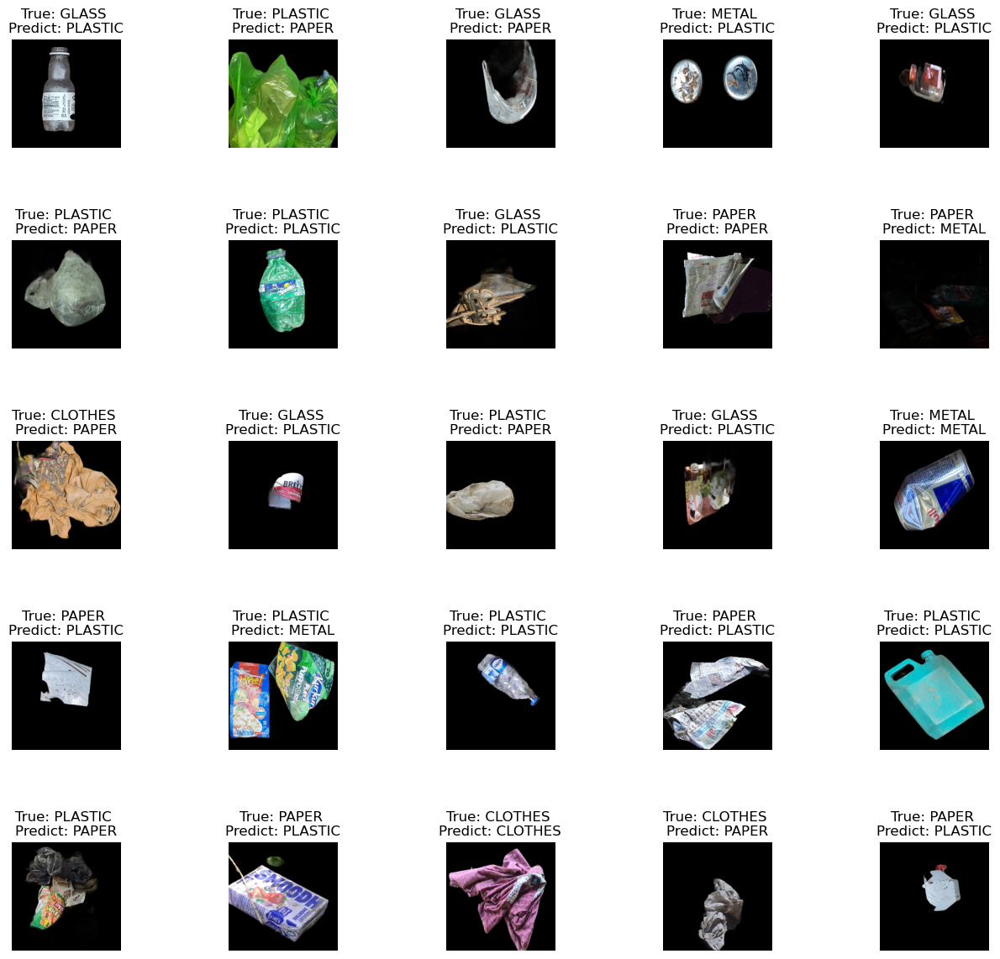

In [125]:
# Plotting the Actual vs. Predicted results
class_names = ['CLOTHES','GLASS', 'METAL', 'PAPER', 'PLASTIC']

fig, axes = plt.subplots(5, 5, figsize=(15,15))
axes = axes.ravel()

for i in np.arange(0, 25):
    axes[i].imshow(X_test_ai[i])
    axes[i].set_title("True: %s \nPredict: %s" % (class_names[np.argmax(Y_test_ai[i])], class_names[pred_labels_ai[i]]))
    axes[i].axis('off')
    plt.subplots_adjust(wspace=1)

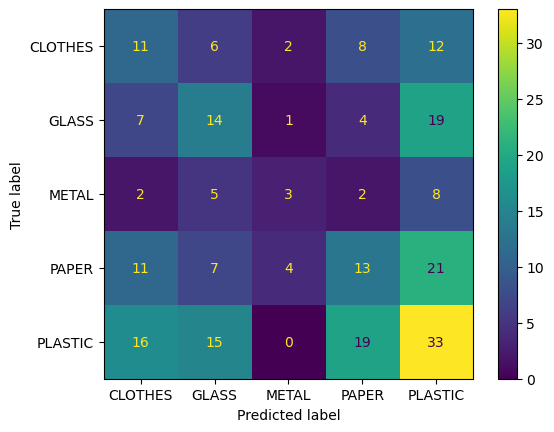

In [172]:
inv_dict = dict(zip(labels.values(), labels.keys()))
correct_pred_ai = [inv_dict.get(e, e) for e in pred_labels_ai]

conf_matrix_ai = confusion_matrix(test_labels_ai2, correct_pred_ai, labels=class_names)
cm_display_ai = ConfusionMatrixDisplay(confusion_matrix = conf_matrix_ai, display_labels=class_names)
cm_display_ai.plot()
plt.show()

As seen above, balancing the classes makes the model work poorly, so we will have to keep the imbalanced classes. I think this might be partially due to the fact that plastic requires much more variety in images compared to the other classes. So having the imbalance actually helps the model identify various pieces of plastic instead of defaulting it.

### 3. Image Augmentation and Parameter Tuning
Trying out data augmentation first

In [129]:
# using the original ai set, shuffled, with black images removed
print(len(train_images_ai2), len(test_images_ai2))
# and X_train_ai, X_val_ai, Y_train_ai, Y_val_ai

1001 243


In [145]:
# trying data augmentation to have more training size
from keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=15,
    horizontal_flip=True,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    zoom_range = 0.2,
    fill_mode='nearest'
    )

# augmenting the partial training set to check for good epoch values
# will fit the full training set after
datagen.fit(X_train_ai)

**Model 6: AI, No Black, Limited, Augmented, Shuffled**

In [157]:
# sequential adding of layers
model6 = Sequential()

model6.add(Conv2D(32, (5, 5), activation='relu', input_shape=(400, 400, 3)))
model6.add(MaxPooling2D((3, 3)))
#model4.add(Dropout(0.25))

model6.add(Conv2D(64, (5, 5), activation='relu'))
model6.add(MaxPooling2D((3, 3)))
#model4.add(Dropout(0.25))

model6.add(Conv2D(64, (5, 5), activation='relu'))
model6.add(MaxPooling2D((3, 3)))
#model1.add(Dropout(0.5))

model6.add(Flatten())
model6.add(Dense(64, activation='relu'))
model6.add(Dense(5, activation='softmax'))

In [158]:
model6.compile(optimizer='adam', loss='categorical_crossentropy', 
              metrics=['accuracy'])

history6 = model6.fit(datagen.flow(X_train_ai, 
                                   Y_train_ai, 
                                   batch_size=20), epochs=10, 
                    validation_data=(X_val_ai, Y_val_ai))

Epoch 1/10
45/45 [==============================] - 51s 1s/step - loss: 1.5279 - accuracy: 0.3344 - val_loss: 1.5384 - val_accuracy: 0.3168
Epoch 2/10
45/45 [==============================] - 51s 1s/step - loss: 1.4629 - accuracy: 0.3500 - val_loss: 1.5140 - val_accuracy: 0.3366
Epoch 3/10
45/45 [==============================] - 49s 1s/step - loss: 1.4328 - accuracy: 0.3900 - val_loss: 1.5442 - val_accuracy: 0.3168
Epoch 4/10
45/45 [==============================] - 49s 1s/step - loss: 1.4118 - accuracy: 0.3867 - val_loss: 1.6388 - val_accuracy: 0.3069
Epoch 5/10
45/45 [==============================] - 49s 1s/step - loss: 1.4143 - accuracy: 0.3867 - val_loss: 1.4789 - val_accuracy: 0.3663
Epoch 6/10
45/45 [==============================] - 49s 1s/step - loss: 1.4086 - accuracy: 0.3756 - val_loss: 1.4681 - val_accuracy: 0.3960
Epoch 7/10
45/45 [==============================] - 50s 1s/step - loss: 1.3812 - accuracy: 0.4067 - val_loss: 1.4869 - val_accuracy: 0.4059
Epoch 8/10
45/45 [==

In [159]:
# evaluating the model against the test dataset
results_ai = model6.evaluate(X_test_ai, Y_test_ai)
results_ai

8/8 [==============================] - 2s 275ms/step - loss: 1.4817 - accuracy: 0.3498


[1.4816514253616333, 0.3497942388057709]

In [160]:
# Making the Predictions
predictions_ai = model6.predict(X_test_ai)

# Converting the predictions into label index 
pred_labels_ai = np.argmax(predictions_ai, axis=1)

8/8 [==============================] - 2s 289ms/step


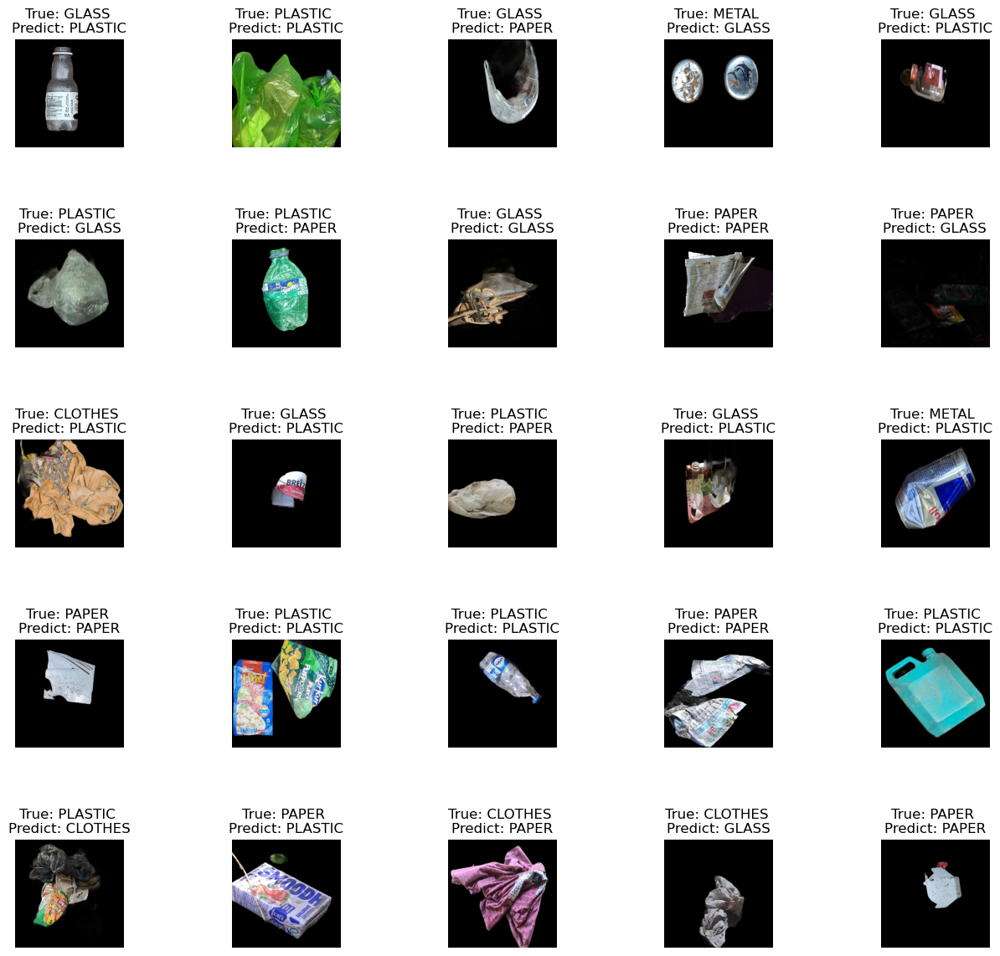

In [161]:
# Plotting the Actual vs. Predicted results
class_names = ['CLOTHES','GLASS', 'METAL', 'PAPER', 'PLASTIC']

fig, axes = plt.subplots(5, 5, figsize=(15,15))
axes = axes.ravel()

for i in np.arange(0, 25):
    axes[i].imshow(X_test_ai[i])
    axes[i].set_title("True: %s \nPredict: %s" % (class_names[np.argmax(Y_test_ai[i])], class_names[pred_labels_ai[i]]))
    axes[i].axis('off')
    plt.subplots_adjust(wspace=1)

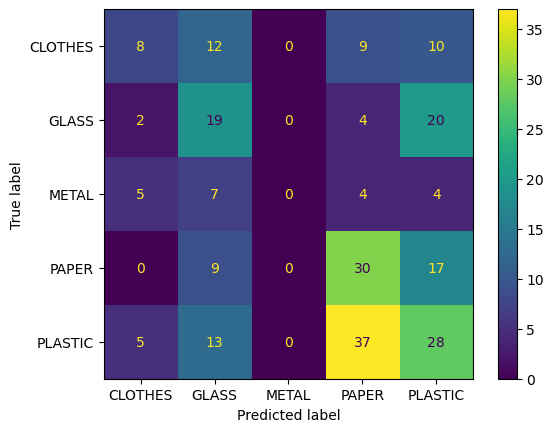

In [162]:
inv_dict = dict(zip(labels.values(), labels.keys()))
correct_pred_ai = [inv_dict.get(e, e) for e in pred_labels_ai]

conf_matrix_ai = confusion_matrix(test_labels_ai2, correct_pred_ai, labels=class_names)
cm_display_ai = ConfusionMatrixDisplay(confusion_matrix = conf_matrix_ai, display_labels=class_names)
cm_display_ai.plot()
plt.show()

Image augmentation completely breaks the predictions for metal objects. So I will have to just tune the hyperparameters.

**Final Model: AI, No Black, Shuffled**

In [23]:
# sequential adding of layers
model7 = Sequential()

model7.add(Conv2D(32, (5, 5), activation='relu', input_shape=(400, 400, 3)))
model7.add(MaxPooling2D((3, 3)))
#model4.add(Dropout(0.25))

model7.add(Conv2D(64, (5, 5), activation='relu'))
model7.add(MaxPooling2D((3, 3)))
#model4.add(Dropout(0.25))

model7.add(Conv2D(64, (5, 5), activation='relu'))
model7.add(MaxPooling2D((3, 3)))
#model1.add(Dropout(0.5))

model7.add(Flatten())
model7.add(Dense(64, activation='relu'))
model7.add(Dense(5, activation='softmax'))

In [25]:
model7.compile(optimizer='adam', loss='categorical_crossentropy', 
              metrics=['accuracy'])

history7 = model7.fit(X_train_ai, Y_train_ai, epochs=10, 
                    validation_data=(X_val_ai, Y_val_ai))

Epoch 1/10
29/29 [==============================] - 63s 2s/step - loss: 1.5022 - accuracy: 0.3522 - val_loss: 1.4603 - val_accuracy: 0.3465
Epoch 2/10
29/29 [==============================] - 59s 2s/step - loss: 1.4056 - accuracy: 0.3767 - val_loss: 1.4639 - val_accuracy: 0.3366
Epoch 3/10
29/29 [==============================] - 58s 2s/step - loss: 1.3041 - accuracy: 0.4578 - val_loss: 1.4843 - val_accuracy: 0.3960
Epoch 4/10
29/29 [==============================] - 58s 2s/step - loss: 1.2219 - accuracy: 0.5211 - val_loss: 1.5484 - val_accuracy: 0.3861
Epoch 5/10
29/29 [==============================] - 58s 2s/step - loss: 1.0208 - accuracy: 0.5967 - val_loss: 1.9755 - val_accuracy: 0.2871
Epoch 6/10
29/29 [==============================] - 59s 2s/step - loss: 0.7840 - accuracy: 0.6944 - val_loss: 2.1948 - val_accuracy: 0.3267
Epoch 7/10
29/29 [==============================] - 58s 2s/step - loss: 0.5256 - accuracy: 0.8022 - val_loss: 2.3265 - val_accuracy: 0.3267
Epoch 8/10
29/29 [==

In [26]:
# evaluating the model against the test dataset
results_ai = model7.evaluate(X_test_ai, Y_test_ai)
results_ai

8/8 [==============================] - 3s 358ms/step - loss: 4.0580 - accuracy: 0.2881


[4.058000087738037, 0.2880658507347107]

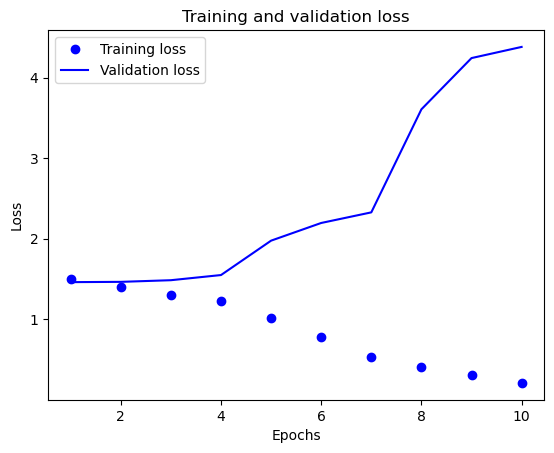

In [27]:
# loss plot
loss = history7.history['loss']
val_loss = history7.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

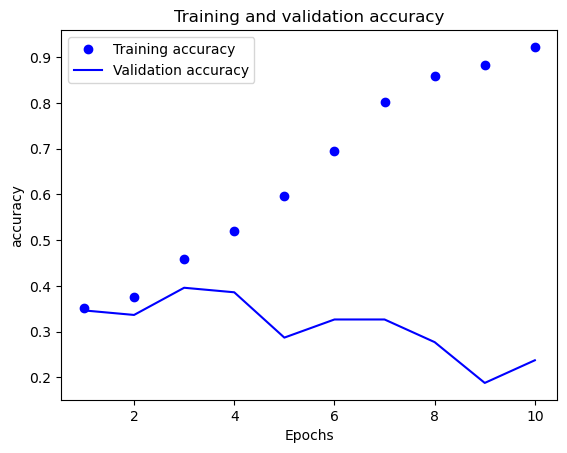

In [28]:
# accuracy plot
acc = history7.history['accuracy']
val_acc = history7.history['val_accuracy']
plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

In [29]:
# Making the Predictions
predictions_ai = model7.predict(X_test_ai)

# Converting the predictions into label index 
pred_labels_ai = np.argmax(predictions_ai, axis=1)

8/8 [==============================] - 3s 357ms/step


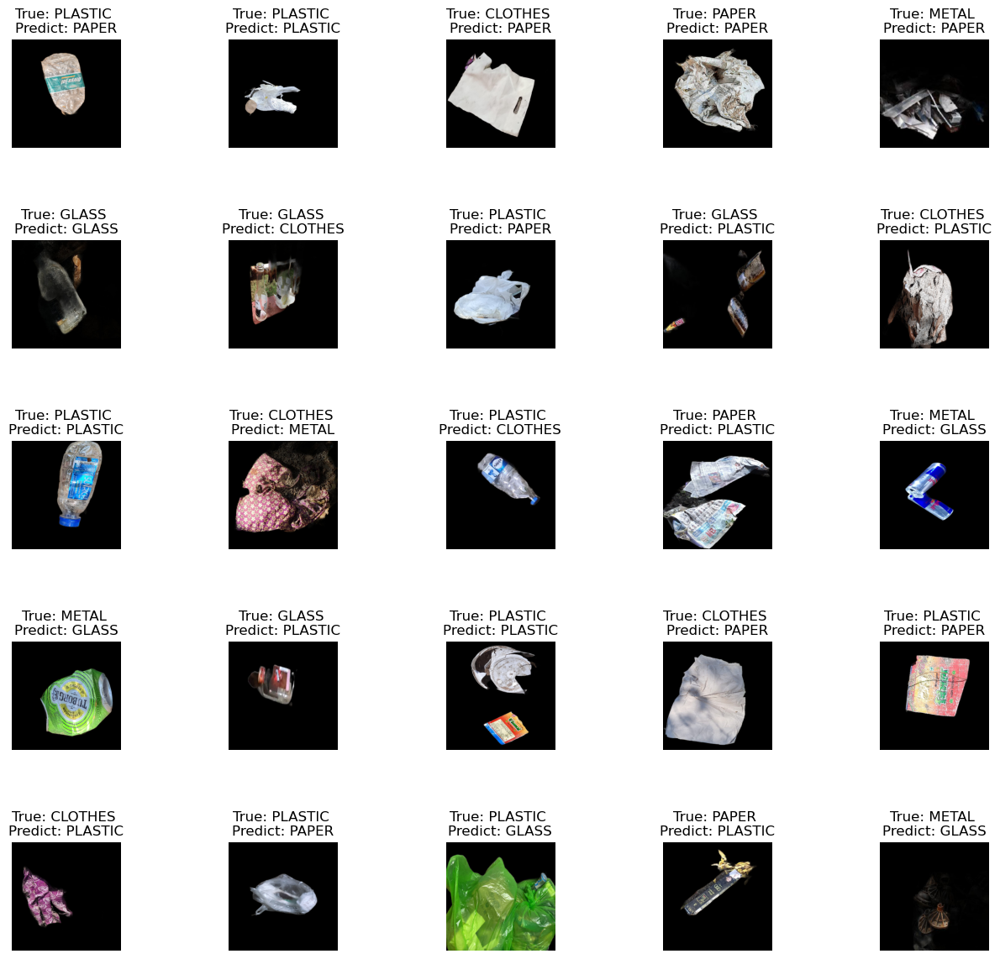

In [30]:
# Plotting the Actual vs. Predicted results
class_names = ['CLOTHES','GLASS', 'METAL', 'PAPER', 'PLASTIC']

fig, axes = plt.subplots(5, 5, figsize=(15,15))
axes = axes.ravel()

for i in np.arange(0, 25):
    axes[i].imshow(X_test_ai[i])
    axes[i].set_title("True: %s \nPredict: %s" % (class_names[np.argmax(Y_test_ai[i])], class_names[pred_labels_ai[i]]))
    axes[i].axis('off')
    plt.subplots_adjust(wspace=1)

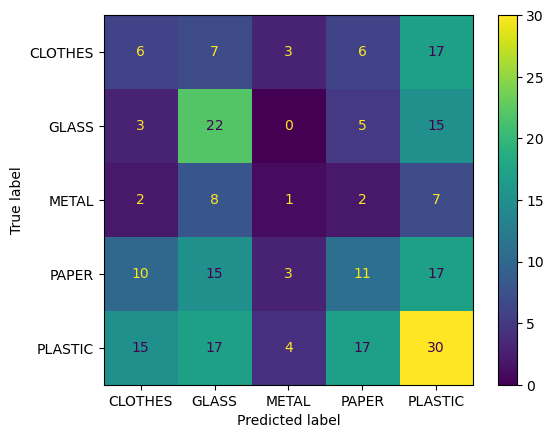

In [31]:
labels = {'CLOTHES': 0, 'GLASS':1, 'METAL': 2, 'PAPER': 3, 'PLASTIC': 4}
inv_dict = dict(zip(labels.values(), labels.keys()))
correct_pred_ai = [inv_dict.get(e, e) for e in pred_labels_ai]

conf_matrix_ai = confusion_matrix(test_labels_ai2, correct_pred_ai, labels=class_names)
cm_display_ai = ConfusionMatrixDisplay(confusion_matrix = conf_matrix_ai, display_labels=class_names)
cm_display_ai.plot()
plt.show()

In [32]:
model7.save("model7.h5")
print("Saved model to disk")

Saved model to disk


C:\Users\rahulrajeev\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [33]:
from tensorflow.keras.models import load_model
# load model
model = load_model('model7.h5')
# summarize model.
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 396, 396, 32)      2432      
                                                                 
 max_pooling2d (MaxPooling2  (None, 132, 132, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      51264     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 42, 42, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 38, 38, 64)        102464    
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 12, 12, 64)        0

## User Interaction Identification Game

While the model remains largely inaccurate (only about 30%), I wanted to see whether a normal person would be able to predict a picture of an item on the ground and compare it to what the model might predict. This small game will ask the user to guess what category a garbage image belongs to, compare to the model and the actual label, and then keep track of the score. It may be an obvious victory for the user being able to identify the images based on existing knowledge, but I thought it would be interesting to look at more obscure items amongst a non ai-enhanced background as a normal person would see it.

I will use the test set and labels as the dataset for random image picking because the data is trained on the training and 
validation data, so picking images might give us the model fit on the training data.

In [81]:
# I will use the original test set without ai for the user and remove the background when a random image is chosen for the model
def get_images():
    images = []
    labels = []
    ai_images = []
    ai_labels = []
    
    for folder in os.listdir('clean_garbageimages/test/'):
        for file in os.listdir('clean_garbageimages/test/'+folder):
            img = load_img(image_fixed_dir.joinpath('test'+'/'+folder+'/'+file), target_size=(400, 400))
            img = img_to_array(img)
            img = img/255
            images.append(img)
            labels.append(folder)
    
    for folder in os.listdir('ai_garbageimages/test/'):
        for file in os.listdir('ai_garbageimages/test/'+folder):
            img = load_img(ai_dir.joinpath('test'+'/'+folder+'/'+file), target_size=(400, 400))
            img = img_to_array(img)
            img = img/255
            ai_images.append(img)
            ai_labels.append(folder)
    
    
    print("Gathering images for game...")
    print('Shape:',len(images), len(labels))
    print('AI Shape:',len(ai_images), len(ai_labels))
    print("All Done...")
    
    
    
    return images, labels, ai_images

In [82]:
images, labels, ai_images = get_images()

Gathering images for game...
Shape: 299 299
AI Shape: 299 299
All Done...


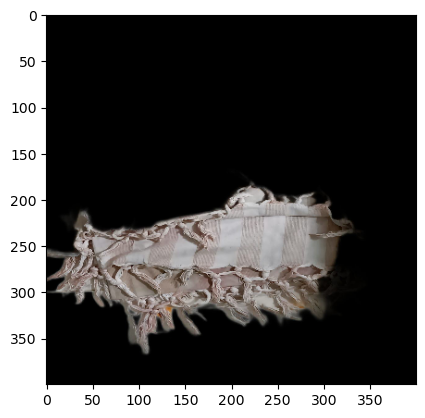

In [84]:
plt.imshow(ai_images[0])

In [85]:
x_ai[0].shape

(400, 400, 3)

In [51]:
x_ai = np.array(ai_images)
model.predict(np.reshape(ai_images[0], (-1, 400, 400, 3)))

1/1 [==============================] - 0s 29ms/step


array([[1.8003939e-01, 1.2761384e-03, 8.8372599e-06, 5.2464224e-04,
        8.1815094e-01]], dtype=float32)

In [157]:
# define a game class

class GarbageIDGame:
    def __init__(self):
        
        # scores 
        self.player_score = 0
        self.system_score = 0
        
        # turns
        self.turns = 0
        
        # image, label, and ai enhanced image
        self.images, self.labels, self.ai_images = get_images()
        
        # load cnn model
        self.model = load_model('model7.h5')
    
    # for when I decide to revisit the project with more training data and higher accuracy
    def load_custom_model(self,model_name):
        model = load_model(model_name)
        
        # summarize model.
        model.summary()
        
        self.model = model

    
    def choose_random_image(self):
        index = random.randint(0, len(self.images) - 1)
        
        # make sure the image is visible for the system (check percent black)
        flag = True
        while flag:
            if percent_black(self.ai_images[index]) > 0.8:
                index = random.randint(0, len(self.images) - 1)
                continue
            else:
                flag = False
        
        print('Image Chosen:')
        plt.imshow(self.images[index])
        plt.show()
        return self.images[index], self.labels[index], self.ai_images[index]
    
    def user_answer(self):
        user_ans = input('Enter your guess for the image. Please choose: CLOTHES, GLASS, METAL, PAPER, or PLASTIC.')
        
        user_ans = user_ans.upper().strip()
        
        correct_responses = ['CLOTHES','GLASS', 'METAL', 'PAPER', 'PLASTIC']
        
        while True:
            if user_ans in correct_responses:
                break
            else:
                user_ans = input('Please enter an answer correctly. (CLOTHES, GLASS, METAL, PAPER, or PLASTIC)')
                user_ans = user_ans.upper().strip()
                continue
        
        print('You predict: ', user_ans)
        
        return user_ans
        
    def model_answer(self,ai_image):
        
        class_names = ['CLOTHES','GLASS', 'METAL', 'PAPER', 'PLASTIC']
        
        ai_image_reshaped = np.reshape(ai_image, (-1, 400, 400, 3))
        
        pred = self.model(ai_image_reshaped)
        pred_label = np.argmax(pred, axis=1).tolist()

        pred_cat = class_names[pred_label[0]]
        
        print('The model predicts: ', pred_cat)
        
        return pred_cat
    
    def evaluate(self,user, model, actual):
        
        if user == actual and model == actual:
            self.player_score += 1
            self.system_score += 1
        
        elif user == actual:
            self.player_score += 1
        
        elif model == actual:
            self.system_score += 1
        
        else:
            print('The scores have not changed.')
        
        print('User score:', self.player_score,'| Model score:',self.system_score)
    
    def play_game(self):
        print('Welcome to Garbage Identification! This is a game that pits you against a machine in predicting the type of'
              'garbage in an image. The options will be out of five: CLOTHES, GLASS, METAL, PAPER, or PLASTIC. \n'
              'You will have the option to guess and based on whether you are correct or not against the true label, you will'
              'be given a point. Your score will be tracked alongside the model predictions. Good luck! \n')
        
        intention = input('Would you like to start playing? Enter "GO" to start, or "STOP" to end the game. ')
        intention = intention.upper().strip()
        
        flag = True
        
        while flag:
            if intention == 'GO':

                # getting the image and the ai image for the model
                image_g, label_g, ai_image_g = self.choose_random_image()

                # getting user answer

                u_ans = self.user_answer()

                # getting model prediction

                m_ans = self.model_answer(ai_image_g)

                print('The correct label was...')
                print(label_g)

                print('Updating Scores:')

                self.evaluate(u_ans, m_ans, label_g)
                
                intention = input('Enter "GO" to keep playing, or "STOP" to end the game. ')
                intention = intention.upper().strip()
                
            elif intention == 'STOP':
                
                if self.turns != 0:
                    print('Final user score:', self.player_score,'| Final Model score:',self.system_score)
                    print('User accuracy:', self.player_score / self.turns, 
                          '| System accuracy:', round(self.system_score / self.turns, 2))
                    if self.player_score > self.system_score:
                        print('Congratulations, you beat a system which uses a CNN model with 30% accuracy!')
                    else:
                        print('Tough luck, you lost against a CNN model with 30% accuracy!')
                
                print('Come back later when the model has been improved!')
                flag = False
            
            else: 
                print('Looks like your intention is unclear.')
                intention = input('Enter "GO" to start playing, or "STOP" to end the game. ')
                intention = intention.upper().strip()
             
            # counting turns
            self.turns += 1

In [158]:
# initialize game
game = GarbageIDGame()

Gathering images for game...
Shape: 299 299
AI Shape: 299 299
All Done...


Welcome to Garbage Identification! This is a game that pits you against a machine in predicting the type ofgarbage in an image. The options will be out of five: CLOTHES, GLASS, METAL, PAPER, or PLASTIC. 
You will have the option to guess and based on whether you are correct or not against the true label, you willbe given a point. Your score will be tracked alongside the model predictions. Good luck! 

Would you like to start playing? Enter "GO" to start, or "STOP" to end the game. go
Image Chosen:


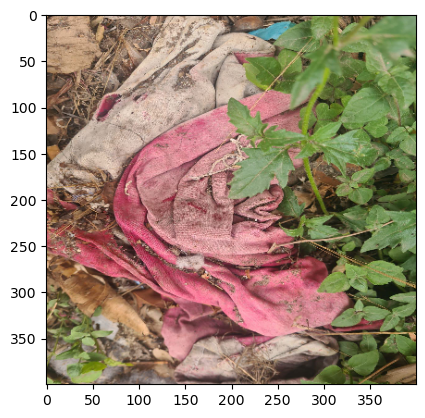

Enter your guess for the image. Please choose: CLOTHES, GLASS, METAL, PAPER, or PLASTIC.clothes
You predict:  CLOTHES
The model predicts:  CLOTHES
The correct label was...
CLOTHES
Updating Scores:
User score: 1 | Model score: 1
Enter "GO" to keep playing, or "STOP" to end the game. go
Image Chosen:


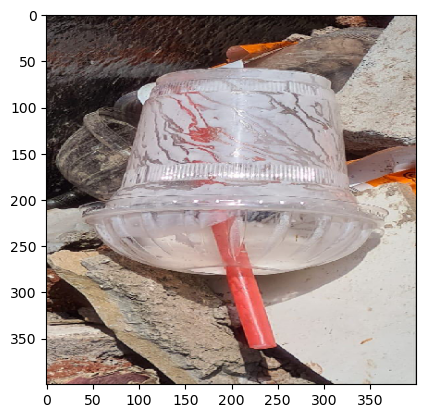

Enter your guess for the image. Please choose: CLOTHES, GLASS, METAL, PAPER, or PLASTIC.plastic
You predict:  PLASTIC
The model predicts:  PAPER
The correct label was...
PLASTIC
Updating Scores:
User score: 2 | Model score: 1
Enter "GO" to keep playing, or "STOP" to end the game. go
Image Chosen:


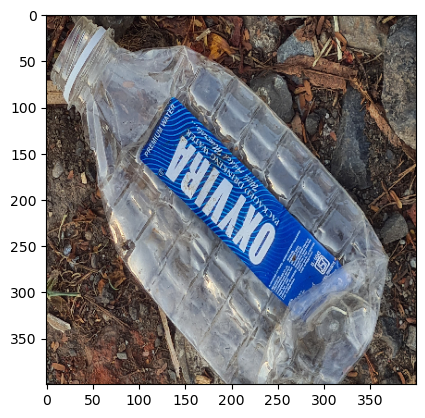

Enter your guess for the image. Please choose: CLOTHES, GLASS, METAL, PAPER, or PLASTIC.plastic
You predict:  PLASTIC
The model predicts:  PLASTIC
The correct label was...
PLASTIC
Updating Scores:
User score: 3 | Model score: 2
Enter "GO" to keep playing, or "STOP" to end the game. stop
Final user score: 3 | Final Model score: 2
User accuracy: 1.0 | System accuracy: 0.67
Congratulations, you beat a system which uses a CNN model with 30% accuracy!
Come back later when the model has been improved!


In [159]:
game.play_game()

## Conclusion

Amidst all the different phases of the project, I found insights in regarding the best methods for data selection and modeling. Starting from the beginning, without ai enhancement, the model tended to overfit towards one class. I investigated the effects of shuffling the data and class balancing, and foudn the latter didn't help much considering the variability in the garbage items. Using the rembg python library, a new set of image directories were created and the model improved in the sense it was able to predict other classes. Similar methods were tried including shuffling, removing all black images, class imbalancing, and data augmentation. The model that worked the "best" was the model that used only shuffling and removing all black images. Class imbalancing fell under teh same issue as the model with out ai enhancement because it overfit the data to the class with the most features the image (either plastic or clothes). Data augmentation using image size and zooming didn't work either because each image was quite unique.

Even with all the iterations of the model, **the accuracy was still quite low around 30%.**

The main limitations of this project was the training size (1299 simplified to around 1000 due to the removal of fully black ai images) and my understanding of neural networks. Since there is a lot of variety among each of the individual classes, it would've been better if more images were added. Perhaps as users continue to use the app, images can be added to the training set after being predicted as the test set with correct labels. THe model performs teh worst on metals (most likely due to it having the most least rigid structures and smallest sample size in both training and validation. 

The garbage identification game was thrown on as sort of an afterthought mostly due to me compensating for a low accuracy. I believed that a project with such a low accuracy should have something interesting or worthwhile interacting with until the next time I come back and work on this with additional experience and better methodologies. Although it works quite smoothly, save for the image load time and model predict time. Hopefully others find inspiration for incorporating something similar in other image classification projects!